# Blood Cell Dataset Creation for Object Detection

## Overview
This notebook creates a custom dataset for training YOLOv11 on blood cell detection. It takes individual cell segments and places them on diverse microscopy backgrounds to generate a comprehensive training dataset with accurate annotations.

## Dataset Characteristics
- **Classes:** 9 blood cell types (basophil, eosinophil, erythroblast, immunoglobin, lymphocyte, monocyte, neutrophil, platelet, lymphoblast)
- **Images:** 10,000 synthetic microscopy images with realistic cell placement
- **Split:** 80/15/5 split for train/validation/test at the segment level
- **Annotations:** YOLO format bounding boxes for each cell

## Process
1. **Data Preparation:** Split and rename source cell segments into train/val/test sets
2. **Image Generation:** Create composite images by placing cell segments on microscopy backgrounds
3. **Annotation:** Generate YOLO format labels with class IDs and normalized coordinates
4. **Verification:** Visualize sample images with bounding boxes to confirm correct placement
5. **Analysis:** Generate statistics on class distribution and dataset characteristics

## Directory Structure
```
dataset/
├── images/          # Composite images with cells
│   ├── train/       # Training images (90%)
│   └── val/         # Validation images (10%)
├── labels/          # YOLO format annotations
│   ├── train/       # Training annotations
│   └── val/         # Validation annotations
├── train/           # Renamed segments for train set
├── val/             # Renamed segments for validation
├── test/            # Renamed segments for test set (unused)
└── dataset.yaml     # YOLO configuration file
```

## Usage
Run this notebook to generate the complete dataset. The code handles all steps from splitting the original data to creating the final images and annotations. Statistics and visualizations help verify dataset quality and balance.

In [5]:
import os
import random
import numpy as np
from PIL import Image
import cv2
import glob

# Define paths
bg_dir = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/background_images"
segments_parent_dir = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/data"
output_dir = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/output"

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Class names
class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
              'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

def get_random_segments(total_count):
    """Get random segments from different classes"""
    selected_segments = []
    
    # Collect all segment paths grouped by class
    all_segments = {}
    for class_name in class_names:
        segment_dir = os.path.join(segments_parent_dir, class_name, "segmented_cells")
        if os.path.exists(segment_dir):
            segment_files = glob.glob(os.path.join(segment_dir, "*"))
            if segment_files:
                all_segments[class_name] = segment_files
    
    if not all_segments:
        raise ValueError("No segment files found in any class directory")
    
    # Randomly select segments
    classes_with_segments = list(all_segments.keys())
    for _ in range(total_count):
        # Randomly select a class
        selected_class = random.choice(classes_with_segments)
        # Randomly select a segment from that class
        if all_segments[selected_class]:
            segment_path = random.choice(all_segments[selected_class])
            selected_segments.append((segment_path, selected_class))
    
    return selected_segments

def is_overlapping(new_box, existing_boxes, padding=5):
    """Check if a new bounding box overlaps with any existing boxes
    
    Args:
        new_box: Tuple of (x1, y1, x2, y2) representing the new box
        existing_boxes: List of (x1, y1, x2, y2) tuples representing existing boxes
        padding: Additional padding around boxes to ensure separation
        
    Returns:
        Boolean: True if overlapping, False otherwise
    """
    new_x1, new_y1, new_x2, new_y2 = new_box
    
    # Add padding to make sure cells have some space between them
    new_x1 -= padding
    new_y1 -= padding
    new_x2 += padding
    new_y2 += padding
    
    for box in existing_boxes:
        x1, y1, x2, y2 = box
        
        # Check if the boxes don't overlap
        if new_x2 < x1 or new_x1 > x2 or new_y2 < y1 or new_y1 > y2:
            continue
        
        # If we get here, the boxes overlap
        return True
    
    # No overlap found
    return False

def place_segments_on_background():
    """Place random cell segments on a random background without overlapping"""
    # Get list of background images
    bg_images = glob.glob(os.path.join(bg_dir, "*"))
    if not bg_images:
        raise ValueError(f"No background images found in {bg_dir}")
    
    # Select a random background
    bg_path = random.choice(bg_images)
    background = cv2.imread(bg_path)
    
    if background is None:
        raise ValueError(f"Failed to load background image: {bg_path}")
    
    bg_height, bg_width = background.shape[:2]
    
    # Determine number of segments to place (between 20-30)
    num_segments = random.randint(20, 30)
    
    # Get random segments
    segments_info = get_random_segments(num_segments)
    
    # Create a list to store bounding box information for annotations
    annotations = []
    
    # Keep track of placed segments' bounding boxes to prevent overlap
    placed_boxes = []
    
    # Place segments on the background
    for segment_path, class_name in segments_info:
        try:
            # Load the segment with alpha channel (with transparency)
            segment_img = cv2.imread(segment_path, cv2.IMREAD_UNCHANGED)
            
            if segment_img is None:
                print(f"Failed to load segment: {segment_path}")
                continue
                
            # Handle different formats of segment images
            if segment_img.shape[2] == 4:  # RGBA
                # Separate RGB and alpha channels
                segment_rgb = segment_img[:, :, :3]
                alpha = segment_img[:, :, 3] / 255.0
                
                # Resize segment if it's too large (optional)
                max_size = min(bg_width, bg_height) // 4
                if segment_img.shape[0] > max_size or segment_img.shape[1] > max_size:
                    scale = max_size / max(segment_img.shape[0], segment_img.shape[1])
                    new_width = int(segment_img.shape[1] * scale)
                    new_height = int(segment_img.shape[0] * scale)
                    segment_rgb = cv2.resize(segment_rgb, (new_width, new_height))
                    alpha = cv2.resize(alpha, (new_width, new_height))
                
                # Get dimensions
                seg_height, seg_width = segment_rgb.shape[:2]
                
                # Try to find a non-overlapping position (maximum 100 attempts)
                max_attempts = 100
                found_position = False
                
                for _ in range(max_attempts):
                    # Random position (ensuring the segment stays within the background)
                    x_pos = random.randint(0, bg_width - seg_width - 1)
                    y_pos = random.randint(0, bg_height - seg_height - 1)
                    
                    # Check if this position would overlap with any existing segment
                    new_box = (x_pos, y_pos, x_pos + seg_width, y_pos + seg_height)
                    if not is_overlapping(new_box, placed_boxes):
                        found_position = True
                        placed_boxes.append(new_box)
                        break
                
                if not found_position:
                    print(f"Could not find non-overlapping position after {max_attempts} attempts. Skipping segment.")
                    continue
                
                # Create a region of interest (ROI) on the background
                roi = background[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width]
                
                # Blend the segment with the background based on alpha
                for c in range(0, 3):
                    roi[:, :, c] = roi[:, :, c] * (1 - alpha) + segment_rgb[:, :, c] * alpha
                
                # Update the background with the blended ROI
                background[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width] = roi
                
                # Store annotation information (class, bounding box coordinates)
                class_id = class_names.index(class_name)
                # Format: [class_id, center_x, center_y, width, height] in normalized coordinates
                center_x = (x_pos + seg_width / 2) / bg_width
                center_y = (y_pos + seg_height / 2) / bg_height
                norm_width = seg_width / bg_width
                norm_height = seg_height / bg_height
                
                annotations.append([class_id, center_x, center_y, norm_width, norm_height])
                
            else:  # RGB or other format - skip this segment
                print(f"Skipping segment without alpha channel: {segment_path}")
                continue
                
        except Exception as e:
            print(f"Error processing segment {segment_path}: {str(e)}")
            continue
    
    # Generate output filename
    bg_filename = os.path.basename(bg_path)
    output_image_path = os.path.join(output_dir, f"composed_{bg_filename}")
    output_label_path = os.path.splitext(output_image_path)[0] + ".txt"
    
    # Save the composed image
    cv2.imwrite(output_image_path, background)
    
    # Save annotations in YOLO format
    with open(output_label_path, 'w') as f:
        for annotation in annotations:
            # Write in YOLO format: class_id center_x center_y width height
            f.write(f"{int(annotation[0])} {annotation[1]:.6f} {annotation[2]:.6f} {annotation[3]:.6f} {annotation[4]:.6f}\n")
    
    print(f"Created composite image with {len(annotations)} segments at: {output_image_path}")
    print(f"Labels saved to: {output_label_path}")
    
    return output_image_path, output_label_path, len(annotations)

# Execute the placement function
if __name__ == "__main__":
    output_image, output_label, num_placed = place_segments_on_background()
    print(f"Successfully placed {num_placed} non-overlapping cell segments")
    
    # Optionally create multiple images
    # num_images = 5
    # for i in range(num_images):
    #     print(f"Creating image {i+1}/{num_images}")
    #     place_segments_on_background()

Could not find non-overlapping position after 100 attempts. Skipping segment.
Could not find non-overlapping position after 100 attempts. Skipping segment.
Created composite image with 24 segments at: /Users/afnanag/projects/DH307/yolov11/segments_on_bg/output/composed_ChatGPT Image Apr 9, 2025 at 02_34_26 PM.png
Labels saved to: /Users/afnanag/projects/DH307/yolov11/segments_on_bg/output/composed_ChatGPT Image Apr 9, 2025 at 02_34_26 PM.txt
Successfully placed 24 non-overlapping cell segments


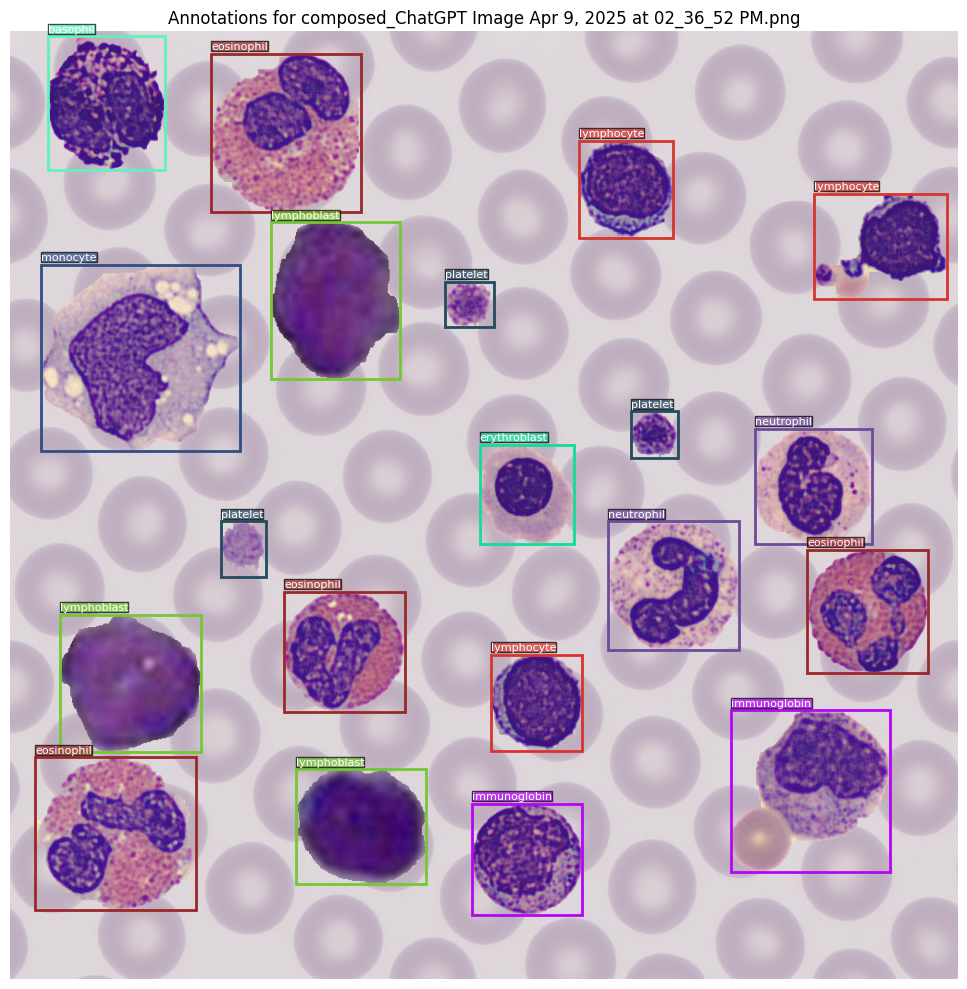

Found 20 annotations from 9 different classes


20

In [11]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import display
from PIL import Image

def display_yolo_annotations_notebook(image_path, annotation_path=None, class_names=None):
    """
    Display an image with bounding boxes from YOLO format annotations in a Jupyter notebook
    
    Args:
        image_path: Path to the image file
        annotation_path: Path to the annotation file (if None, will look for .txt with same name as image)
        class_names: List of class names (if None, will use default cell types)
    """
    # Set default class names if not provided
    if class_names is None:
        class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
                      'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    # If annotation path not provided, derive from image path
    if annotation_path is None:
        annotation_path = os.path.splitext(image_path)[0] + ".txt"
    
    # Check if files exist
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return
        
    if not os.path.exists(annotation_path):
        print(f"Error: Annotation file not found at {annotation_path}")
        return
    
    # Load the image (using PIL for better compatibility with matplotlib)
    image = Image.open(image_path)
    width, height = image.size
    
    # Create figure and axis
    plt.figure(figsize=(12, 10))
    ax = plt.gca()
    
    # Display the image
    ax.imshow(image)
    
    # Generate different colors for different classes
    np.random.seed(42)  # for reproducible colors
    colors = {}
    for i in range(len(class_names)):
        colors[i] = np.random.rand(3,)  # Random RGB color
    
    # Read annotations
    with open(annotation_path, 'r') as f:
        lines = f.readlines()
    
    # Process each annotation
    for line in lines:
        line = line.strip()
        if not line:
            continue
            
        # Parse line (class_id center_x center_y width height)
        parts = line.split()
        if len(parts) != 5:
            print(f"Warning: Skipping invalid annotation line: {line}")
            continue
            
        class_id = int(parts[0])
        center_x = float(parts[1]) * width
        center_y = float(parts[2]) * height
        bbox_width = float(parts[3]) * width
        bbox_height = float(parts[4]) * height
        
        # Calculate top-left corner from center
        x = center_x - (bbox_width / 2)
        y = center_y - (bbox_height / 2)
        
        # Get class name
        class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown({class_id})"
        
        # Get color for this class
        color = colors[class_id % len(colors)]
        
        # Create rectangle patch
        rect = Rectangle((x, y), bbox_width, bbox_height, 
                         linewidth=2, edgecolor=color, facecolor='none')
        
        # Add rectangle to the plot
        ax.add_patch(rect)
        
        # Add label
        plt.text(x, y - 5, class_name, 
                 bbox=dict(facecolor=color, alpha=0.7, pad=0),
                 color='white', fontsize=8)
    
    # Remove axes and add title
    plt.axis('off')
    plt.title(f"Annotations for {os.path.basename(image_path)}")
    
    # Show the plot
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"Found {len(lines)} annotations from {len(set([int(line.split()[0]) for line in lines if line.strip()]))} different classes")
    
    return len(lines)  # Return number of annotations for convenience

# Example usage (uncomment and modify paths to run this):
display_yolo_annotations_notebook('/Users/afnanag/projects/DH307/yolov11/segments_on_bg/output/composed_ChatGPT Image Apr 9, 2025 at 02_36_52 PM.png')

# To display a specific image and annotation file:
# display_yolo_annotations_notebook(
#     image_path='/Users/afnanag/projects/DH307/yolov11/segments_on_bg/output/composed_bg1.jpg',
#     annotation_path='/Users/afnanag/projects/DH307/yolov11/segments_on_bg/output/composed_bg1.txt'
# )

Step 1: Renaming and splitting segments...
Found 1213 segments for class basophil
Found 2918 segments for class eosinophil
Found 1335 segments for class erythroblast
Found 2812 segments for class immunoglobin
Found 1142 segments for class lymphocyte
Found 1411 segments for class monocyte
Found 2131 segments for class neutrophil
Found 2291 segments for class platelet
Found 869 segments for class lymphoblast

Step 2: Generating dataset...
Found 31 background images


Generating dataset:   1%|          | 104/10000 [00:04<06:36, 24.97it/s]


Created 100 images (88 train, 12 val)


Generating dataset:   2%|▏         | 203/10000 [00:08<06:44, 24.23it/s]


Created 200 images (179 train, 21 val)


Generating dataset:   3%|▎         | 305/10000 [00:12<06:23, 25.26it/s]


Created 300 images (272 train, 28 val)


Generating dataset:   4%|▍         | 404/10000 [00:17<06:52, 23.28it/s]


Created 400 images (364 train, 36 val)


Generating dataset:   5%|▌         | 503/10000 [00:21<06:19, 25.01it/s]


Created 500 images (455 train, 45 val)


Generating dataset:   6%|▌         | 605/10000 [00:25<05:48, 26.98it/s]


Created 600 images (548 train, 52 val)


Generating dataset:   7%|▋         | 704/10000 [00:29<06:55, 22.39it/s]


Created 700 images (635 train, 65 val)


Generating dataset:   8%|▊         | 803/10000 [00:33<06:15, 24.52it/s]


Created 800 images (724 train, 76 val)


Generating dataset:   9%|▉         | 905/10000 [00:37<06:04, 24.93it/s]


Created 900 images (815 train, 85 val)


Generating dataset:  10%|█         | 1004/10000 [00:41<05:49, 25.71it/s]


Created 1000 images (901 train, 99 val)


Generating dataset:  11%|█         | 1103/10000 [00:45<05:52, 25.23it/s]


Created 1100 images (991 train, 109 val)


Generating dataset:  12%|█▏        | 1205/10000 [00:49<05:40, 25.81it/s]


Created 1200 images (1079 train, 121 val)


Generating dataset:  13%|█▎        | 1304/10000 [00:53<05:40, 25.52it/s]


Created 1300 images (1172 train, 128 val)


Generating dataset:  14%|█▍        | 1404/10000 [00:57<05:36, 25.54it/s]


Created 1400 images (1266 train, 134 val)


Generating dataset:  15%|█▌        | 1503/10000 [01:01<05:37, 25.17it/s]


Created 1500 images (1361 train, 139 val)


Generating dataset:  16%|█▌        | 1602/10000 [01:05<05:26, 25.68it/s]


Created 1600 images (1448 train, 152 val)


Generating dataset:  17%|█▋        | 1702/10000 [01:09<05:35, 24.73it/s]


Created 1700 images (1542 train, 158 val)


Generating dataset:  18%|█▊        | 1802/10000 [01:13<05:40, 24.06it/s]


Created 1800 images (1630 train, 170 val)


Generating dataset:  19%|█▉        | 1904/10000 [01:17<05:40, 23.75it/s]


Created 1900 images (1721 train, 179 val)


Generating dataset:  20%|██        | 2003/10000 [01:21<05:24, 24.65it/s]


Created 2000 images (1811 train, 189 val)


Generating dataset:  21%|██        | 2105/10000 [01:25<05:13, 25.17it/s]


Created 2100 images (1902 train, 198 val)


Generating dataset:  22%|██▏       | 2204/10000 [01:29<05:33, 23.38it/s]


Created 2200 images (1993 train, 207 val)


Generating dataset:  23%|██▎       | 2303/10000 [01:34<05:27, 23.52it/s]


Created 2300 images (2087 train, 213 val)


Generating dataset:  24%|██▍       | 2402/10000 [01:38<05:05, 24.84it/s]


Created 2400 images (2177 train, 223 val)


Generating dataset:  25%|██▌       | 2504/10000 [01:42<05:20, 23.41it/s]


Created 2500 images (2263 train, 237 val)


Generating dataset:  26%|██▌       | 2603/10000 [01:47<05:21, 23.02it/s]


Created 2600 images (2355 train, 245 val)


Generating dataset:  27%|██▋       | 2702/10000 [01:51<05:07, 23.73it/s]


Created 2700 images (2438 train, 262 val)


Generating dataset:  28%|██▊       | 2804/10000 [01:55<04:42, 25.48it/s]


Created 2800 images (2535 train, 265 val)


Generating dataset:  29%|██▉       | 2903/10000 [01:59<04:48, 24.57it/s]


Created 2900 images (2629 train, 271 val)


Generating dataset:  30%|███       | 3002/10000 [02:03<04:34, 25.51it/s]


Created 3000 images (2714 train, 286 val)


Generating dataset:  31%|███       | 3104/10000 [02:07<05:09, 22.31it/s]


Created 3100 images (2807 train, 293 val)


Generating dataset:  32%|███▏      | 3203/10000 [02:11<04:49, 23.47it/s]


Created 3200 images (2894 train, 306 val)


Generating dataset:  33%|███▎      | 3305/10000 [02:15<04:26, 25.09it/s]


Created 3300 images (2984 train, 316 val)


Generating dataset:  34%|███▍      | 3404/10000 [02:19<04:24, 24.98it/s]


Created 3400 images (3070 train, 330 val)


Generating dataset:  35%|███▌      | 3503/10000 [02:23<04:58, 21.75it/s]


Created 3500 images (3158 train, 342 val)


Generating dataset:  36%|███▌      | 3602/10000 [02:27<04:40, 22.83it/s]


Created 3600 images (3243 train, 357 val)


Generating dataset:  37%|███▋      | 3704/10000 [02:32<04:14, 24.78it/s]


Created 3700 images (3331 train, 369 val)


Generating dataset:  38%|███▊      | 3803/10000 [02:36<03:52, 26.62it/s]


Created 3800 images (3424 train, 376 val)


Generating dataset:  39%|███▉      | 3905/10000 [02:40<04:10, 24.31it/s]


Created 3900 images (3507 train, 393 val)


Generating dataset:  40%|████      | 4004/10000 [02:44<04:04, 24.48it/s]


Created 4000 images (3594 train, 406 val)


Generating dataset:  41%|████      | 4103/10000 [02:48<04:08, 23.69it/s]


Created 4100 images (3681 train, 419 val)


Generating dataset:  42%|████▏     | 4205/10000 [02:52<03:48, 25.37it/s]


Created 4200 images (3775 train, 425 val)


Generating dataset:  43%|████▎     | 4304/10000 [02:56<03:47, 25.00it/s]


Created 4300 images (3863 train, 437 val)


Generating dataset:  44%|████▍     | 4403/10000 [03:00<03:37, 25.75it/s]


Created 4400 images (3945 train, 455 val)


Generating dataset:  45%|████▌     | 4505/10000 [03:04<03:36, 25.38it/s]


Created 4500 images (4034 train, 466 val)


Generating dataset:  46%|████▌     | 4605/10000 [03:08<03:24, 26.40it/s]


Created 4600 images (4120 train, 480 val)


Generating dataset:  47%|████▋     | 4704/10000 [03:12<03:20, 26.36it/s]


Created 4700 images (4211 train, 489 val)


Generating dataset:  48%|████▊     | 4803/10000 [03:16<03:44, 23.12it/s]


Created 4800 images (4302 train, 498 val)


Generating dataset:  49%|████▉     | 4902/10000 [03:20<03:25, 24.82it/s]


Created 4900 images (4390 train, 510 val)


Generating dataset:  50%|█████     | 5002/10000 [03:24<03:12, 25.98it/s]


Created 5000 images (4476 train, 524 val)


Generating dataset:  51%|█████     | 5104/10000 [03:28<03:27, 23.64it/s]


Created 5100 images (4565 train, 535 val)


Generating dataset:  52%|█████▏    | 5203/10000 [03:32<03:14, 24.67it/s]


Created 5200 images (4654 train, 546 val)


Generating dataset:  53%|█████▎    | 5302/10000 [03:36<03:13, 24.24it/s]


Created 5300 images (4741 train, 559 val)


Generating dataset:  54%|█████▍    | 5405/10000 [03:40<02:58, 25.78it/s]


Created 5400 images (4832 train, 568 val)


Generating dataset:  55%|█████▌    | 5504/10000 [03:44<02:52, 26.07it/s]


Created 5500 images (4919 train, 581 val)


Generating dataset:  56%|█████▌    | 5604/10000 [03:48<02:48, 26.14it/s]


Created 5600 images (5013 train, 587 val)


Generating dataset:  57%|█████▋    | 5704/10000 [03:52<02:37, 27.25it/s]


Created 5700 images (5098 train, 602 val)


Generating dataset:  58%|█████▊    | 5804/10000 [03:56<02:41, 26.00it/s]


Created 5800 images (5191 train, 609 val)


Generating dataset:  59%|█████▉    | 5903/10000 [04:00<02:39, 25.63it/s]


Created 5900 images (5283 train, 617 val)


Generating dataset:  60%|██████    | 6002/10000 [04:03<02:38, 25.16it/s]


Created 6000 images (5373 train, 627 val)


Generating dataset:  61%|██████    | 6104/10000 [04:08<02:37, 24.70it/s]


Created 6100 images (5459 train, 641 val)


Generating dataset:  62%|██████▏   | 6203/10000 [04:12<02:34, 24.61it/s]


Created 6200 images (5548 train, 652 val)


Generating dataset:  63%|██████▎   | 6305/10000 [04:16<02:22, 26.00it/s]


Created 6300 images (5637 train, 663 val)


Generating dataset:  64%|██████▍   | 6404/10000 [04:20<02:23, 25.15it/s]


Created 6400 images (5725 train, 675 val)


Generating dataset:  65%|██████▌   | 6503/10000 [04:24<02:23, 24.42it/s]


Created 6500 images (5817 train, 683 val)


Generating dataset:  66%|██████▌   | 6605/10000 [04:28<02:15, 24.98it/s]


Created 6600 images (5907 train, 693 val)


Generating dataset:  67%|██████▋   | 6704/10000 [04:32<02:09, 25.43it/s]


Created 6700 images (5991 train, 709 val)


Generating dataset:  68%|██████▊   | 6803/10000 [04:36<02:04, 25.62it/s]


Created 6800 images (6079 train, 721 val)


Generating dataset:  69%|██████▉   | 6905/10000 [04:40<02:04, 24.94it/s]


Created 6900 images (6169 train, 731 val)


Generating dataset:  70%|███████   | 7004/10000 [04:44<02:00, 24.91it/s]


Created 7000 images (6260 train, 740 val)


Generating dataset:  71%|███████   | 7104/10000 [04:48<02:01, 23.92it/s]


Created 7100 images (6351 train, 749 val)


Generating dataset:  72%|███████▏  | 7203/10000 [04:52<01:57, 23.80it/s]


Created 7200 images (6441 train, 759 val)


Generating dataset:  73%|███████▎  | 7303/10000 [04:56<01:50, 24.39it/s]


Created 7300 images (6532 train, 768 val)


Generating dataset:  74%|███████▍  | 7405/10000 [05:00<01:45, 24.51it/s]


Created 7400 images (6621 train, 779 val)


Generating dataset:  75%|███████▌  | 7504/10000 [05:04<01:47, 23.15it/s]


Created 7500 images (6713 train, 787 val)


Generating dataset:  76%|███████▌  | 7604/10000 [05:08<01:32, 26.04it/s]


Created 7600 images (6810 train, 790 val)


Generating dataset:  77%|███████▋  | 7703/10000 [05:12<01:36, 23.73it/s]


Created 7700 images (6898 train, 802 val)


Generating dataset:  78%|███████▊  | 7803/10000 [05:16<01:34, 23.23it/s]


Created 7800 images (6984 train, 816 val)


Generating dataset:  79%|███████▉  | 7904/10000 [05:21<01:41, 20.56it/s]


Created 7900 images (7074 train, 826 val)


Generating dataset:  80%|████████  | 8004/10000 [05:26<01:35, 20.86it/s]


Created 8000 images (7160 train, 840 val)


Generating dataset:  81%|████████  | 8103/10000 [05:31<01:31, 20.74it/s]


Created 8100 images (7251 train, 849 val)


Generating dataset:  82%|████████▏ | 8202/10000 [05:35<01:21, 22.09it/s]


Created 8200 images (7343 train, 857 val)


Generating dataset:  83%|████████▎ | 8304/10000 [05:40<01:21, 20.85it/s]


Created 8300 images (7433 train, 867 val)


Generating dataset:  84%|████████▍ | 8402/10000 [05:45<01:15, 21.24it/s]


Created 8400 images (7529 train, 871 val)


Generating dataset:  85%|████████▌ | 8502/10000 [05:50<01:10, 21.34it/s]


Created 8500 images (7610 train, 890 val)


Generating dataset:  86%|████████▌ | 8603/10000 [05:54<01:14, 18.68it/s]


Created 8600 images (7702 train, 898 val)


Generating dataset:  87%|████████▋ | 8704/10000 [05:59<00:59, 21.89it/s]


Created 8700 images (7785 train, 915 val)


Generating dataset:  88%|████████▊ | 8804/10000 [06:04<00:54, 22.06it/s]


Created 8800 images (7873 train, 927 val)


Generating dataset:  89%|████████▉ | 8903/10000 [06:08<00:49, 22.26it/s]


Created 8900 images (7967 train, 933 val)


Generating dataset:  90%|█████████ | 9002/10000 [06:13<00:41, 23.82it/s]


Created 9000 images (8059 train, 941 val)


Generating dataset:  91%|█████████ | 9104/10000 [06:17<00:38, 23.51it/s]


Created 9100 images (8146 train, 954 val)


Generating dataset:  92%|█████████▏| 9203/10000 [06:21<00:32, 24.59it/s]


Created 9200 images (8234 train, 966 val)


Generating dataset:  93%|█████████▎| 9302/10000 [06:26<00:28, 24.21it/s]


Created 9300 images (8321 train, 979 val)


Generating dataset:  94%|█████████▍| 9404/10000 [06:30<00:24, 23.85it/s]


Created 9400 images (8412 train, 988 val)


Generating dataset:  95%|█████████▌| 9503/10000 [06:34<00:19, 25.03it/s]


Created 9500 images (8501 train, 999 val)


Generating dataset:  96%|█████████▌| 9602/10000 [06:38<00:17, 22.60it/s]


Created 9600 images (8600 train, 1000 val)


Generating dataset:  97%|█████████▋| 9704/10000 [06:42<00:12, 24.02it/s]


Created 9700 images (8700 train, 1000 val)


Generating dataset:  98%|█████████▊| 9803/10000 [06:46<00:07, 25.09it/s]


Created 9800 images (8800 train, 1000 val)


Generating dataset:  99%|█████████▉| 9905/10000 [06:50<00:03, 24.97it/s]


Created 9900 images (8900 train, 1000 val)


Generating dataset: 100%|██████████| 10000/10000 [06:54<00:00, 24.14it/s]



Created 10000 images (9000 train, 1000 val)

Finished dataset generation: 9000 train images, 1000 val images

Step 3: Displaying sample images...
Displaying sample: /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/images/train/bg004414.jpg


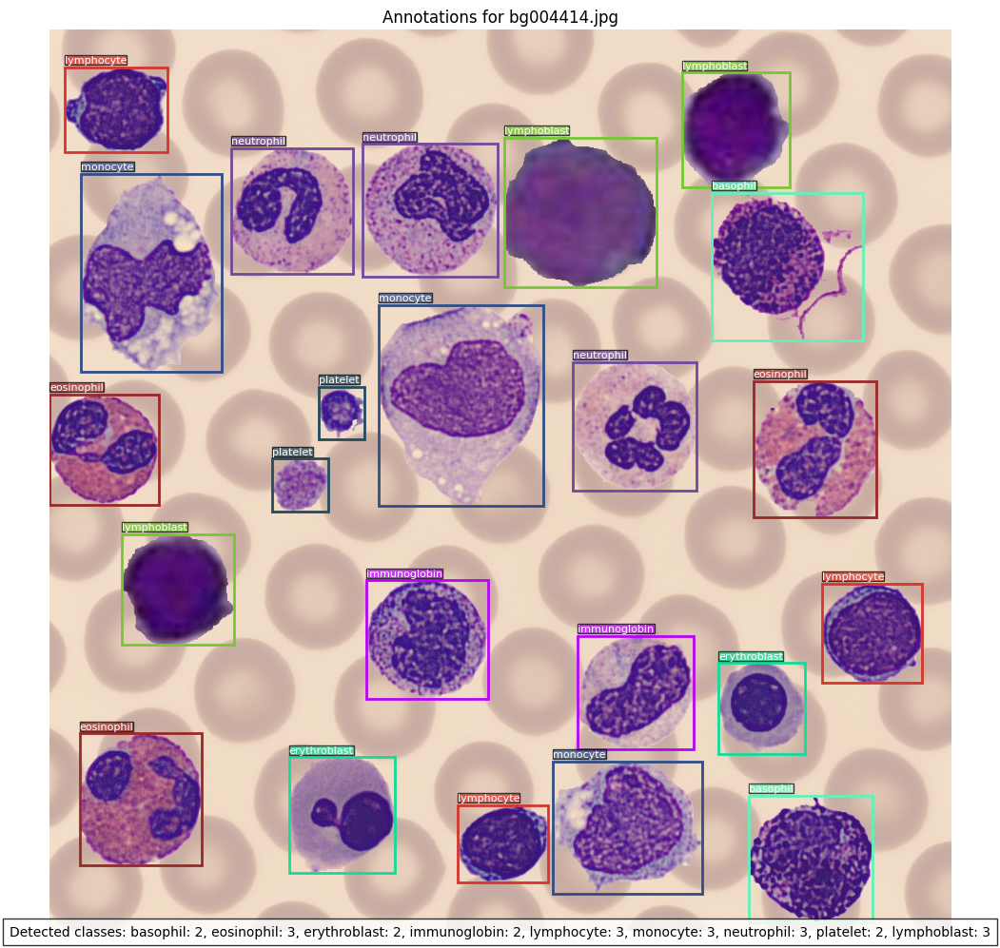

Total annotations: 23
Displaying sample: /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/images/val/bg004429.jpg


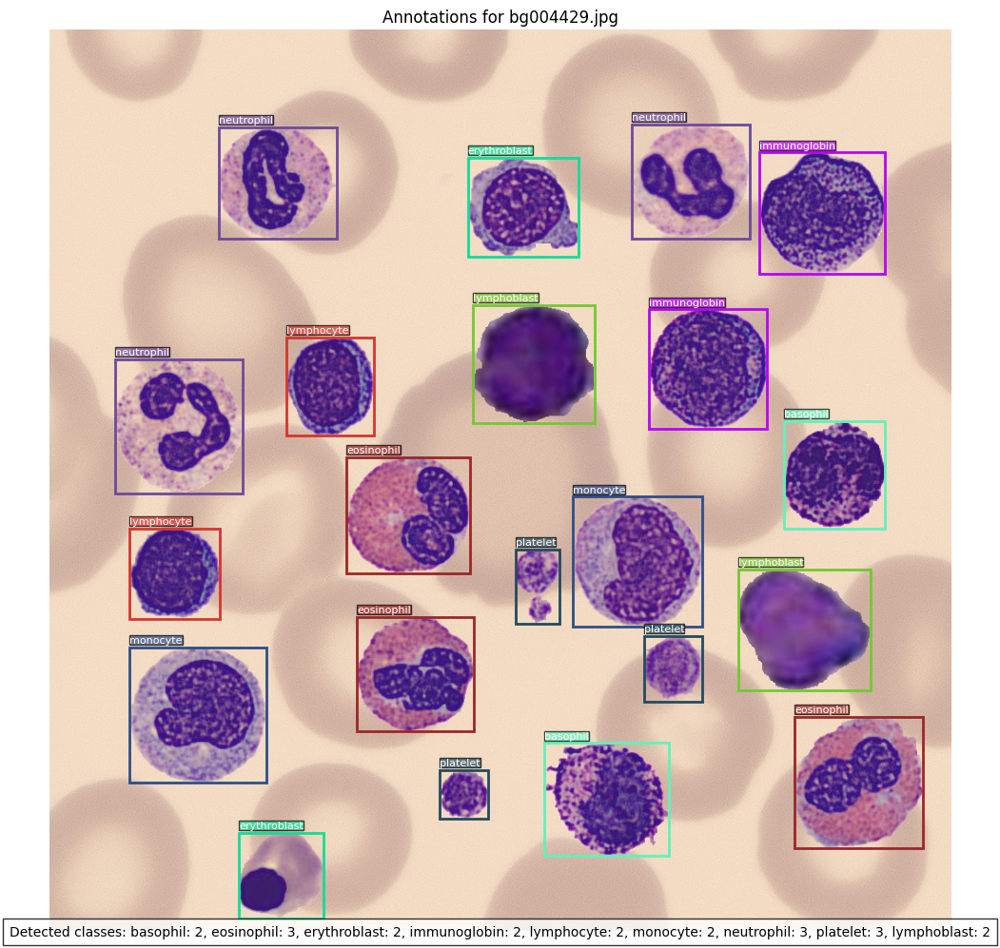

Total annotations: 21

Step 4: Plotting statistics...


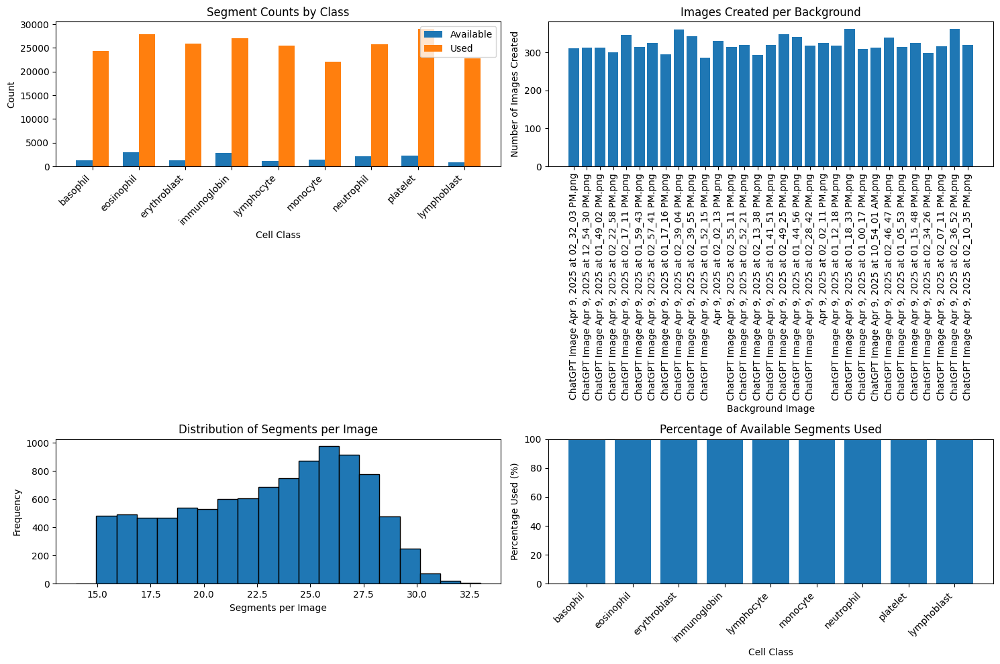


===== Dataset Creation Summary =====
Total images created: 10000
Train images: 9000
Validation images: 1000
Total segments used: 230413
basophil: Used 24356/1213 segments (2007.9%)
eosinophil: Used 27897/2918 segments (956.0%)
erythroblast: Used 25921/1335 segments (1941.6%)
immunoglobin: Used 27088/2812 segments (963.3%)
lymphocyte: Used 25452/1142 segments (2228.7%)
monocyte: Used 22134/1411 segments (1568.7%)
neutrophil: Used 25762/2131 segments (1208.9%)
platelet: Used 29074/2291 segments (1269.1%)
lymphoblast: Used 22729/869 segments (2615.5%)

Dataset creation completed in 421.13 seconds (7.02 minutes)

YOLO dataset config saved to /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/dataset.yaml

Dataset creation complete!


In [12]:
import os
import glob
import random
import shutil
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.patches import Rectangle
from tqdm import tqdm
import pandas as pd
import concurrent.futures
import time
from pathlib import Path

# Define paths
BG_DIR = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/background_images"
SEGMENTS_PARENT_DIR = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/data"
OUTPUT_BASE_DIR = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset"

# Create output directories
TRAIN_DIR = os.path.join(OUTPUT_BASE_DIR, "train")
VAL_DIR = os.path.join(OUTPUT_BASE_DIR, "val")
TEST_DIR = os.path.join(OUTPUT_BASE_DIR, "test")
IMAGES_DIR = os.path.join(OUTPUT_BASE_DIR, "images")
LABELS_DIR = os.path.join(OUTPUT_BASE_DIR, "labels")

# Create all necessary directories
for directory in [OUTPUT_BASE_DIR, TRAIN_DIR, VAL_DIR, TEST_DIR, 
                 os.path.join(IMAGES_DIR, "train"), os.path.join(IMAGES_DIR, "val"),
                 os.path.join(LABELS_DIR, "train"), os.path.join(LABELS_DIR, "val")]:
    os.makedirs(directory, exist_ok=True)

# Class names
CLASS_NAMES = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
              'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Parameters
TRAIN_RATIO = 0.8
VAL_RATIO = 0.15
TEST_RATIO = 0.05
TOTAL_IMAGES_TO_GENERATE = 10000
TARGET_IMAGES_PER_BACKGROUND = TOTAL_IMAGES_TO_GENERATE // 31  # Distribute across 31 backgrounds

# Stats tracking
stats = {
    'total_segments_per_class': {cls: 0 for cls in CLASS_NAMES},
    'segments_used_per_class': {cls: 0 for cls in CLASS_NAMES},
    'images_per_background': {},
    'segments_placed_per_image': []
}

def rename_and_split_segments():
    """
    Rename segments to include class number and split into train/val/test sets.
    Return dictionary of segments for each split.
    """
    all_segments = {}
    segments_by_split = {'train': {}, 'val': {}, 'test': {}}
    
    # First, collect all segments by class
    for class_idx, class_name in enumerate(CLASS_NAMES):
        segment_dir = os.path.join(SEGMENTS_PARENT_DIR, class_name, "segmented_cells")
        if not os.path.exists(segment_dir):
            print(f"Warning: Directory not found for class {class_name} at {segment_dir}")
            continue
            
        segment_files = glob.glob(os.path.join(segment_dir, "*"))
        if not segment_files:
            print(f"Warning: No segments found for class {class_name}")
            continue
            
        all_segments[class_name] = segment_files
        stats['total_segments_per_class'][class_name] = len(segment_files)
        print(f"Found {len(segment_files)} segments for class {class_name}")
        
        # Shuffle segments for random splitting
        random.shuffle(segment_files)
        
        # Calculate split sizes
        train_size = int(len(segment_files) * TRAIN_RATIO)
        val_size = int(len(segment_files) * VAL_RATIO)
        
        # Split segments
        train_segments = segment_files[:train_size]
        val_segments = segment_files[train_size:train_size + val_size]
        test_segments = segment_files[train_size + val_size:]
        
        # Store in the split dictionary
        segments_by_split['train'][class_name] = train_segments
        segments_by_split['val'][class_name] = val_segments
        segments_by_split['test'][class_name] = test_segments
        
        # Create directories for renamed segments
        os.makedirs(os.path.join(TRAIN_DIR, class_name), exist_ok=True)
        os.makedirs(os.path.join(VAL_DIR, class_name), exist_ok=True)
        os.makedirs(os.path.join(TEST_DIR, class_name), exist_ok=True)
        
        # Copy and rename segments
        for split_name, segments in zip(['train', 'val', 'test'], 
                                      [train_segments, val_segments, test_segments]):
            dest_dir = os.path.join(OUTPUT_BASE_DIR, split_name, class_name)
            
            for i, segment_path in enumerate(segments):
                segment_filename = os.path.basename(segment_path)
                # Rename to include class number: {class_idx}_{original_name}
                new_name = f"{class_idx}_{segment_filename}"
                dest_path = os.path.join(dest_dir, new_name)
                
                # Copy the file
                shutil.copy2(segment_path, dest_path)
    
    return segments_by_split

def is_overlapping(new_box, existing_boxes, padding=5):
    """Check if a new bounding box overlaps with any existing boxes"""
    new_x1, new_y1, new_x2, new_y2 = new_box
    
    # Add padding to make sure cells have some space between them
    new_x1 -= padding
    new_y1 -= padding
    new_x2 += padding
    new_y2 += padding
    
    for box in existing_boxes:
        x1, y1, x2, y2 = box
        
        # Check if the boxes don't overlap
        if new_x2 < x1 or new_x1 > x2 or new_y2 < y1 or new_y1 > y2:
            continue
        
        # If we get here, the boxes overlap
        return True
    
    # No overlap found
    return False

def create_image_with_segments(bg_path, split_segments, image_index, split):
    """Create a composite image with segments from a given split"""
    try:
        # Load background image
        background = cv2.imread(bg_path)
        if background is None:
            print(f"Error: Could not load background image {bg_path}")
            return None
        
        bg_height, bg_width = background.shape[:2]
        bg_name = os.path.basename(bg_path)
        
        # Create output filenames
        output_image_path = os.path.join(IMAGES_DIR, split, f"bg{image_index:06d}.jpg")
        output_label_path = os.path.join(LABELS_DIR, split, f"bg{image_index:06d}.txt")
        
        # Determine how many segments to place (between 15-35 per image)
        num_segments = random.randint(15, 35)
        
        # Get random segments from each class, ensuring balance
        selected_segments = []
        segments_per_class = max(1, num_segments // len(CLASS_NAMES))
        
        # First, ensure at least one segment from each class if possible
        for class_name in CLASS_NAMES:
            if class_name in split_segments and split_segments[class_name]:
                # Get segments_per_class random segments for this class
                available_segments = split_segments[class_name]
                num_to_take = min(segments_per_class, len(available_segments))
                
                class_segments = random.sample(available_segments, num_to_take)
                for segment in class_segments:
                    selected_segments.append((segment, class_name))
        
        # If we need more segments, add randomly from any class
        remaining_slots = num_segments - len(selected_segments)
        if remaining_slots > 0:
            # Flatten all available segments
            all_available = []
            for class_name in CLASS_NAMES:
                if class_name in split_segments:
                    for segment in split_segments[class_name]:
                        all_available.append((segment, class_name))
            
            # Randomly select more if needed
            if all_available:
                additional = random.sample(all_available, min(remaining_slots, len(all_available)))
                selected_segments.extend(additional)
        
        # Shuffle the selected segments
        random.shuffle(selected_segments)
        
        # Track placed segments
        placed_boxes = []
        annotations = []
        segments_used = {cls: 0 for cls in CLASS_NAMES}
        
        # Place segments on the background
        for segment_path, class_name in selected_segments:
            try:
                # Load the segment with alpha channel
                segment_img = cv2.imread(segment_path, cv2.IMREAD_UNCHANGED)
                
                if segment_img is None:
                    continue
                    
                # Handle different formats
                if segment_img.shape[2] == 4:  # RGBA
                    # Separate RGB and alpha channels
                    segment_rgb = segment_img[:, :, :3]
                    alpha = segment_img[:, :, 3] / 255.0
                    
                    # Resize if too large
                    max_size = min(bg_width, bg_height) // 4
                    if segment_img.shape[0] > max_size or segment_img.shape[1] > max_size:
                        scale = max_size / max(segment_img.shape[0], segment_img.shape[1])
                        new_width = int(segment_img.shape[1] * scale)
                        new_height = int(segment_img.shape[0] * scale)
                        segment_rgb = cv2.resize(segment_rgb, (new_width, new_height))
                        alpha = cv2.resize(alpha, (new_width, new_height))
                    
                    # Get dimensions
                    seg_height, seg_width = segment_rgb.shape[:2]
                    
                    # Try to find a non-overlapping position
                    max_attempts = 100
                    found_position = False
                    
                    for _ in range(max_attempts):
                        # Random position
                        x_pos = random.randint(0, bg_width - seg_width - 1)
                        y_pos = random.randint(0, bg_height - seg_height - 1)
                        
                        # Check for overlap
                        new_box = (x_pos, y_pos, x_pos + seg_width, y_pos + seg_height)
                        if not is_overlapping(new_box, placed_boxes):
                            found_position = True
                            placed_boxes.append(new_box)
                            break
                    
                    if not found_position:
                        continue
                    
                    # Create a region of interest on the background
                    roi = background[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width]
                    
                    # Blend the segment with the background based on alpha
                    for c in range(0, 3):
                        roi[:, :, c] = roi[:, :, c] * (1 - alpha) + segment_rgb[:, :, c] * alpha
                    
                    # Update the background with the blended ROI
                    background[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width] = roi
                    
                    # Store annotation in YOLO format
                    class_id = CLASS_NAMES.index(class_name)
                    center_x = (x_pos + seg_width / 2) / bg_width
                    center_y = (y_pos + seg_height / 2) / bg_height
                    norm_width = seg_width / bg_width
                    norm_height = seg_height / bg_height
                    
                    annotations.append([class_id, center_x, center_y, norm_width, norm_height])
                    segments_used[class_name] += 1
                    
                else:  # Not RGBA, skip
                    continue
                    
            except Exception as e:
                print(f"Error processing segment {segment_path}: {str(e)}")
                continue
        
        # Only save if we placed at least one segment
        if annotations:
            # Save the image
            cv2.imwrite(output_image_path, background)
            
            # Save annotations
            with open(output_label_path, 'w') as f:
                for annotation in annotations:
                    f.write(f"{int(annotation[0])} {annotation[1]:.6f} {annotation[2]:.6f} {annotation[3]:.6f} {annotation[4]:.6f}\n")
            
            # Update stats
            for cls, count in segments_used.items():
                stats['segments_used_per_class'][cls] += count
            
            bg_key = os.path.basename(bg_path)
            if bg_key not in stats['images_per_background']:
                stats['images_per_background'][bg_key] = 0
            stats['images_per_background'][bg_key] += 1
            
            stats['segments_placed_per_image'].append(len(annotations))
            
            return True
        
        return None
        
    except Exception as e:
        print(f"Error creating image with segments: {str(e)}")
        return None

def generate_dataset(segments_by_split):
    """Generate the full dataset with balanced distribution"""
    # Get all background images
    bg_images = glob.glob(os.path.join(BG_DIR, "*"))
    if not bg_images:
        raise ValueError(f"No background images found in {BG_DIR}")
    
    print(f"Found {len(bg_images)} background images")
    
    # Create images for train and val splits
    image_counts = {'train': 0, 'val': 0}
    target_counts = {
        'train': int(TOTAL_IMAGES_TO_GENERATE * 0.9),  # 90% train
        'val': int(TOTAL_IMAGES_TO_GENERATE * 0.1)     # 10% val
    }
    
    # Create image index counter
    image_index = 0
    
    # Process backgrounds in a loop until we reach the target counts
    with tqdm(total=TOTAL_IMAGES_TO_GENERATE, desc="Generating dataset") as pbar:
        while (image_counts['train'] < target_counts['train'] or 
               image_counts['val'] < target_counts['val']):
            
            # Determine which split needs more images
            if image_counts['train'] >= target_counts['train']:
                active_split = 'val'
            elif image_counts['val'] >= target_counts['val']:
                active_split = 'train'
            else:
                # Both need more, choose randomly with weight toward train
                active_split = 'train' if random.random() < 0.9 else 'val'
            
            # Exit if we've reached both targets
            if image_counts[active_split] >= target_counts[active_split]:
                break
                
            # Select a random background
            bg_path = random.choice(bg_images)
            
            # Create image with segments from the active split
            result = create_image_with_segments(
                bg_path, 
                segments_by_split[active_split], 
                image_index, 
                active_split
            )
            
            if result:
                image_counts[active_split] += 1
                image_index += 1
                pbar.update(1)
                
                # Print progress occasionally
                if image_index % 100 == 0:
                    print(f"\nCreated {image_index} images ({image_counts['train']} train, {image_counts['val']} val)")
    
    print(f"\nFinished dataset generation: {image_counts['train']} train images, {image_counts['val']} val images")
    return image_counts

def display_yolo_annotations(image_path, annotation_path=None, class_names=None):
    """Display an image with YOLO bounding boxes"""
    if class_names is None:
        class_names = CLASS_NAMES
        
    if annotation_path is None:
        annotation_path = os.path.splitext(image_path)[0] + ".txt"
        # If image is in images/train, look for label in labels/train
        if "images" in image_path:
            base_name = os.path.basename(image_path)
            split = os.path.basename(os.path.dirname(image_path))
            annotation_path = os.path.join(LABELS_DIR, split, os.path.splitext(base_name)[0] + ".txt")
    
    # Check if files exist
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return
        
    if not os.path.exists(annotation_path):
        print(f"Error: Annotation file not found at {annotation_path}")
        return
    
    # Load the image using PIL
    image = Image.open(image_path)
    width, height = image.size
    
    # Create figure
    plt.figure(figsize=(12, 10))
    ax = plt.gca()
    
    # Display the image
    ax.imshow(image)
    
    # Generate colors for classes
    np.random.seed(42)
    colors = {}
    for i in range(len(class_names)):
        colors[i] = np.random.rand(3,)
    
    # Read annotations
    with open(annotation_path, 'r') as f:
        lines = f.readlines()
    
    # Track class count in this image
    class_count = {cls: 0 for cls in class_names}
    
    # Process each annotation
    for line in lines:
        line = line.strip()
        if not line:
            continue
            
        # Parse YOLO format
        parts = line.split()
        if len(parts) != 5:
            continue
            
        class_id = int(parts[0])
        center_x = float(parts[1]) * width
        center_y = float(parts[2]) * height
        bbox_width = float(parts[3]) * width
        bbox_height = float(parts[4]) * height
        
        # Calculate top-left from center
        x = center_x - (bbox_width / 2)
        y = center_y - (bbox_height / 2)
        
        # Get class info
        if class_id < len(class_names):
            class_name = class_names[class_id]
            class_count[class_name] += 1
        else:
            class_name = f"Unknown({class_id})"
        
        # Get color
        color = colors[class_id % len(colors)]
        
        # Create rectangle
        rect = Rectangle((x, y), bbox_width, bbox_height, 
                         linewidth=2, edgecolor=color, facecolor='none')
        
        # Add to plot
        ax.add_patch(rect)
        
        # Add label
        plt.text(x, y - 5, class_name, 
                 bbox=dict(facecolor=color, alpha=0.7, pad=0),
                 color='white', fontsize=8)
    
    # Finish plot
    plt.axis('off')
    plt.title(f"Annotations for {os.path.basename(image_path)}")
    
    # Display class counts
    class_info = ", ".join([f"{cls}: {count}" for cls, count in class_count.items() if count > 0])
    plt.figtext(0.5, 0.01, f"Detected classes: {class_info}", 
                ha="center", fontsize=10, bbox={"facecolor":"white", "alpha":0.8, "pad":5})
    
    # Show
    plt.tight_layout()
    plt.show()
    
    print(f"Total annotations: {len(lines)}")
    return len(lines)

def plot_stats():
    """Plot statistics about the dataset"""
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Total segments per class
    plt.subplot(2, 2, 1)
    classes = list(stats['total_segments_per_class'].keys())
    total_counts = list(stats['total_segments_per_class'].values())
    used_counts = list(stats['segments_used_per_class'].values())
    
    x = np.arange(len(classes))
    width = 0.35
    
    plt.bar(x - width/2, total_counts, width, label='Available')
    plt.bar(x + width/2, used_counts, width, label='Used')
    
    plt.xlabel('Cell Class')
    plt.ylabel('Count')
    plt.title('Segment Counts by Class')
    plt.xticks(x, classes, rotation=45, ha='right')
    plt.legend()
    
    # Plot 2: Images per background
    plt.subplot(2, 2, 2)
    bg_names = list(stats['images_per_background'].keys())
    bg_counts = list(stats['images_per_background'].values())
    
    plt.bar(bg_names, bg_counts)
    plt.xlabel('Background Image')
    plt.ylabel('Number of Images Created')
    plt.title('Images Created per Background')
    plt.xticks(rotation=90)
    
    # Plot 3: Distribution of segments per image
    plt.subplot(2, 2, 3)
    plt.hist(stats['segments_placed_per_image'], bins=20, edgecolor='black')
    plt.xlabel('Segments per Image')
    plt.ylabel('Frequency')
    plt.title('Distribution of Segments per Image')
    
    # Plot 4: Percentage of available segments used
    plt.subplot(2, 2, 4)
    percentages = []
    class_names = []
    
    for cls in CLASS_NAMES:
        if stats['total_segments_per_class'][cls] > 0:
            percentage = (stats['segments_used_per_class'][cls] / stats['total_segments_per_class'][cls]) * 100
            percentages.append(percentage)
            class_names.append(cls)
    
    plt.bar(class_names, percentages)
    plt.xlabel('Cell Class')
    plt.ylabel('Percentage Used (%)')
    plt.title('Percentage of Available Segments Used')
    plt.ylim(0, 100)
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'dataset_stats.png'))
    plt.show()

def main():
    """Main function to execute all steps"""
    start_time = time.time()
    
    # Step 1: Rename and split segments
    print("Step 1: Renaming and splitting segments...")
    segments_by_split = rename_and_split_segments()
    
    # Step 2: Generate the dataset
    print("\nStep 2: Generating dataset...")
    image_counts = generate_dataset(segments_by_split)
    
    # Step 3: Display some sample images
    print("\nStep 3: Displaying sample images...")
    
    # Pick random images from train and val
    train_images = glob.glob(os.path.join(IMAGES_DIR, "train", "*.jpg"))
    val_images = glob.glob(os.path.join(IMAGES_DIR, "val", "*.jpg"))
    
    samples = []
    if train_images:
        samples.append(random.choice(train_images))
    if val_images:
        samples.append(random.choice(val_images))
    
    for sample in samples:
        print(f"Displaying sample: {sample}")
        display_yolo_annotations(sample)
    
    # Step 4: Plot statistics
    print("\nStep 4: Plotting statistics...")
    plot_stats()
    
    # Print summary
    total_train = len(glob.glob(os.path.join(IMAGES_DIR, "train", "*.jpg")))
    total_val = len(glob.glob(os.path.join(IMAGES_DIR, "val", "*.jpg")))
    
    print("\n===== Dataset Creation Summary =====")
    print(f"Total images created: {total_train + total_val}")
    print(f"Train images: {total_train}")
    print(f"Validation images: {total_val}")
    
    total_segments_used = sum(stats['segments_used_per_class'].values())
    print(f"Total segments used: {total_segments_used}")
    
    for cls in CLASS_NAMES:
        available = stats['total_segments_per_class'][cls]
        used = stats['segments_used_per_class'][cls]
        if available > 0:
            percentage = (used / available) * 100
            print(f"{cls}: Used {used}/{available} segments ({percentage:.1f}%)")
    
    time_elapsed = time.time() - start_time
    print(f"\nDataset creation completed in {time_elapsed:.2f} seconds ({time_elapsed/60:.2f} minutes)")
    
    # Create dataset.yaml for YOLOv5/YOLOv11
    yaml_path = os.path.join(OUTPUT_BASE_DIR, 'dataset.yaml')
    with open(yaml_path, 'w') as f:
        f.write(f"path: {OUTPUT_BASE_DIR}\n")
        f.write("train: images/train\n")
        f.write("val: images/val\n")
        f.write(f"nc: {len(CLASS_NAMES)}\n")
        f.write(f"names: {CLASS_NAMES}\n")
    
    print(f"\nYOLO dataset config saved to {yaml_path}")
    print("\nDataset creation complete!")

if __name__ == "__main__":
    main()

# Prediction

Loaded 62 basophil test segments
Loaded 147 eosinophil test segments
Loaded 67 erythroblast test segments
Loaded 142 immunoglobin test segments
Loaded 58 lymphocyte test segments
Loaded 72 monocyte test segments
Loaded 108 neutrophil test segments
Loaded 116 platelet test segments
Loaded 44 lymphoblast test segments
Model loaded successfully
Generating 5 test images...

Processing test image 1/5
Created test image with 25 cells

image 1/1 /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results/test_image_1.jpg: 1024x1024 3 basophils, 3 eosinophils, 3 erythroblasts, 3 immunoglobins, 3 lymphocytes, 2 monocytes, 3 neutrophils, 3 platelets, 2 lymphoblasts, 612.8ms
Speed: 3.2ms preprocess, 612.8ms inference, 0.9ms postprocess per image at shape (1, 3, 1024, 1024)
Evaluation results for test image 1:
  Precision: 1.0000
  Recall: 1.0000
  F1 Score: 1.0000
  True Positives: 25
  False Positives: 0
  False Negatives: 0

Class-specific metrics:
  basophil:
    Precision: 1.000

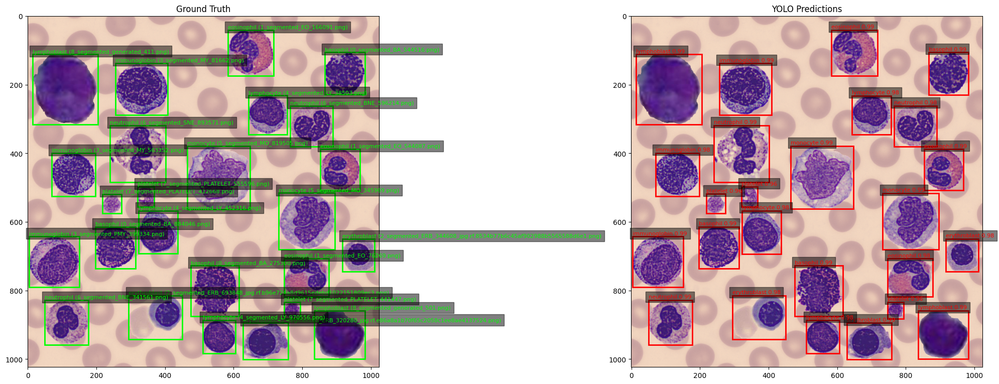


Processing test image 2/5
Created test image with 18 cells

image 1/1 /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results/test_image_2.jpg: 1024x1024 2 basophils, 2 eosinophils, 2 erythroblasts, 2 immunoglobins, 2 lymphocytes, 2 monocytes, 2 neutrophils, 2 platelets, 2 lymphoblasts, 595.9ms
Speed: 2.9ms preprocess, 595.9ms inference, 0.6ms postprocess per image at shape (1, 3, 1024, 1024)
Evaluation results for test image 2:
  Precision: 1.0000
  Recall: 1.0000
  F1 Score: 1.0000
  True Positives: 18
  False Positives: 0
  False Negatives: 0

Class-specific metrics:
  basophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  eosinophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  erythroblast:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  immunoglobin:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  

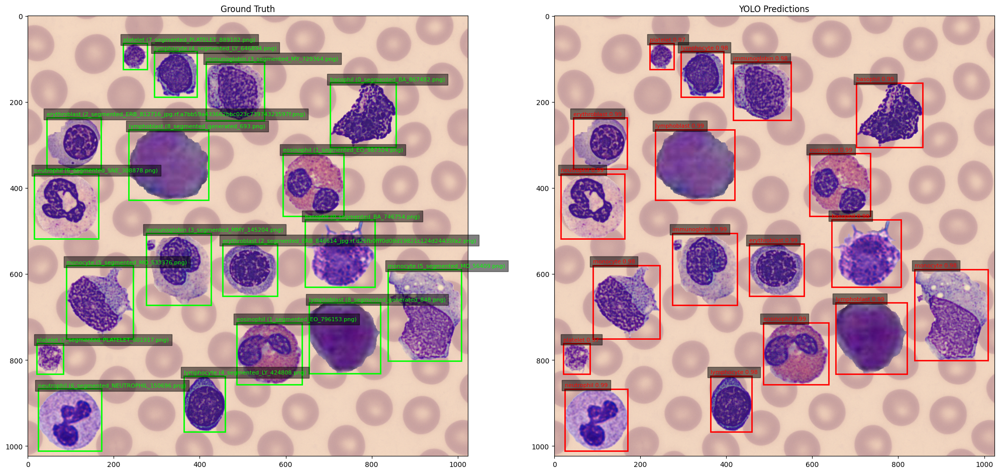


Processing test image 3/5
Created test image with 18 cells

image 1/1 /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results/test_image_3.jpg: 1024x1024 2 basophils, 2 eosinophils, 2 erythroblasts, 2 immunoglobins, 2 lymphocytes, 2 monocytes, 2 neutrophils, 2 platelets, 2 lymphoblasts, 593.9ms
Speed: 3.1ms preprocess, 593.9ms inference, 0.7ms postprocess per image at shape (1, 3, 1024, 1024)
Evaluation results for test image 3:
  Precision: 1.0000
  Recall: 1.0000
  F1 Score: 1.0000
  True Positives: 18
  False Positives: 0
  False Negatives: 0

Class-specific metrics:
  basophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  eosinophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  erythroblast:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  immunoglobin:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 2, FP: 0, FN: 0
  

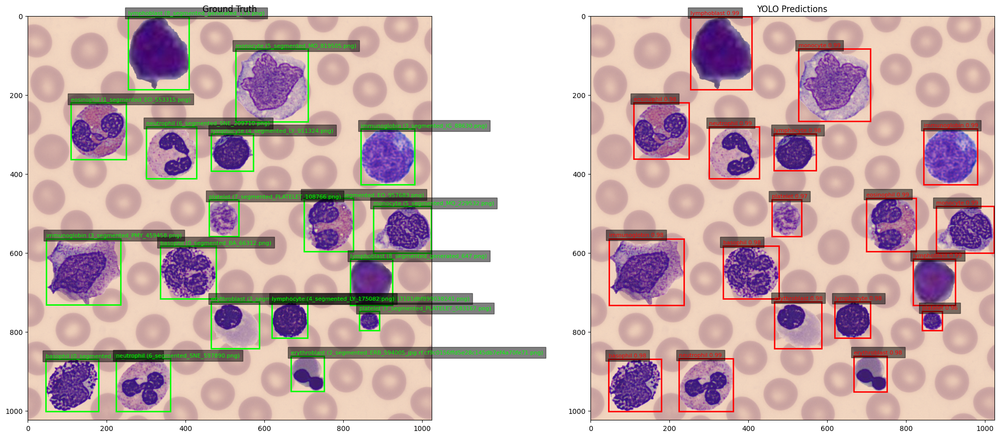


Processing test image 4/5
Created test image with 24 cells

image 1/1 /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results/test_image_4.jpg: 1024x1024 3 basophils, 3 eosinophils, 3 erythroblasts, 2 immunoglobins, 3 lymphocytes, 3 monocytes, 4 neutrophils, 3 platelets, 617.7ms
Speed: 2.7ms preprocess, 617.7ms inference, 14.9ms postprocess per image at shape (1, 3, 1024, 1024)
Evaluation results for test image 4:
  Precision: 0.9583
  Recall: 0.9583
  F1 Score: 0.9583
  True Positives: 23
  False Positives: 1
  False Negatives: 1

Class-specific metrics:
  basophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 3, FP: 0, FN: 0
  eosinophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 3, FP: 0, FN: 0
  erythroblast:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 3, FP: 0, FN: 0
  immunoglobin:
    Precision: 1.0000
    Recall: 0.6667
    F1 Score: 0.8000
    TP: 2, FP: 0, FN: 1
  lymphocyte:
   

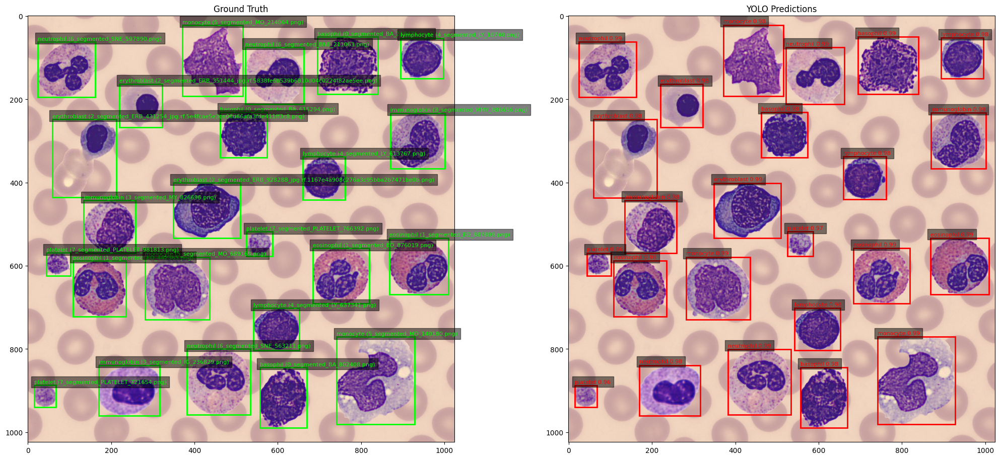


Processing test image 5/5
Created test image with 9 cells

image 1/1 /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results/test_image_5.jpg: 1024x1024 1 basophil, 1 eosinophil, 1 erythroblast, 1 immunoglobin, 1 lymphocyte, 1 monocyte, 1 neutrophil, 1 platelet, 1 lymphoblast, 573.8ms
Speed: 2.4ms preprocess, 573.8ms inference, 0.7ms postprocess per image at shape (1, 3, 1024, 1024)
Evaluation results for test image 5:
  Precision: 1.0000
  Recall: 1.0000
  F1 Score: 1.0000
  True Positives: 9
  False Positives: 0
  False Negatives: 0

Class-specific metrics:
  basophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 1, FP: 0, FN: 0
  eosinophil:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 1, FP: 0, FN: 0
  erythroblast:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 1, FP: 0, FN: 0
  immunoglobin:
    Precision: 1.0000
    Recall: 1.0000
    F1 Score: 1.0000
    TP: 1, FP: 0, FN: 0
  lymphocyte:

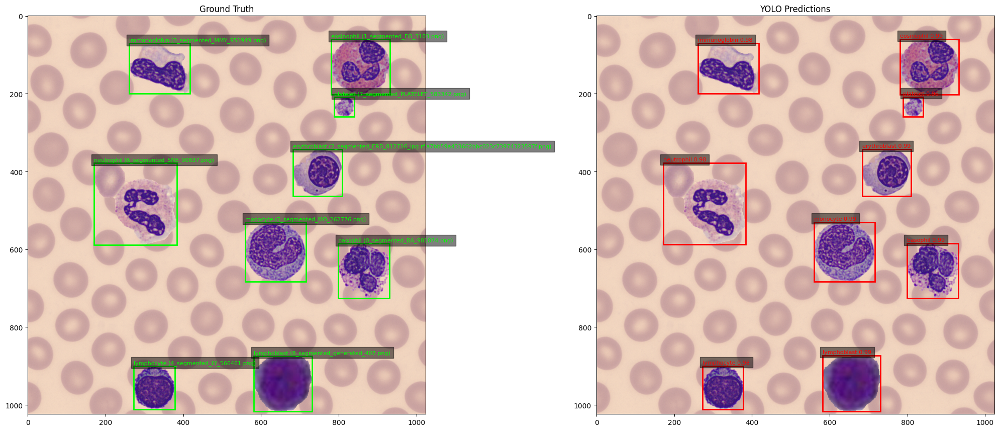


===== Overall Evaluation Results =====
Average Precision: 0.9917
Average Recall: 0.9917
Average F1 Score: 0.9917
All test results saved to: /Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/test_results


In [13]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from ultralytics import YOLO
from PIL import Image
import concurrent.futures
from pathlib import Path

# Define paths using the structure from your provided code
OUTPUT_BASE_DIR = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset"
TEST_DIR = os.path.join(OUTPUT_BASE_DIR, "test")
BG_PATH = "/Users/afnanag/projects/DH307/yolov11/segments_on_bg/dataset/background.png"
MODEL_PATH = "/Users/afnanag/projects/DH307/yolov11/runs/detect/train11/weights/best.pt"

# Class names
CLASS_NAMES = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
               'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

def check_overlap(new_box, existing_boxes, margin=5):
    """Check if a new box overlaps with any existing boxes."""
    if not existing_boxes:
        return False
        
    new_x1, new_y1, new_x2, new_y2 = new_box
    
    # Add a small margin to prevent cells from being too close
    new_x1 -= margin
    new_y1 -= margin
    new_x2 += margin
    new_y2 += margin
    
    for box in existing_boxes:
        x1, y1, x2, y2 = box
        
        # Check for overlap
        if not (new_x2 < x1 or new_x1 > x2 or new_y2 < y1 or new_y1 > y2):
            return True
    
    return False

def load_test_segments():
    """Load all test segments from the test directory structure."""
    segments = {}
    
    for class_name in CLASS_NAMES:
        class_dir = os.path.join(TEST_DIR, class_name)
        if os.path.exists(class_dir):
            segments[class_name] = []
            for file_path in glob.glob(os.path.join(class_dir, "*.png")):
                segment = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
                if segment is not None:
                    segments[class_name].append((segment, file_path))
            print(f"Loaded {len(segments[class_name])} {class_name} test segments")
    
    return segments

def place_segments_on_background(background, segments, num_cells_per_class=2):
    """Place test segments on the background without overlap."""
    bg_height, bg_width = background.shape[:2]
    placed_cells = []
    existing_boxes = []
    
    # Make a copy of the background to work with
    result = background.copy()
    
    # Ensure background has proper channels
    if len(result.shape) == 2:  # Grayscale
        result = cv2.cvtColor(result, cv2.COLOR_GRAY2BGR)
    elif result.shape[2] == 4:  # RGBA
        result = cv2.cvtColor(result, cv2.COLOR_BGRA2BGR)
    
    # Try to place segments from each class
    for class_name in CLASS_NAMES:
        if class_name not in segments or not segments[class_name]:
            continue
            
        # Choose random segments for this class
        available_segments = segments[class_name]
        num_to_place = min(num_cells_per_class, len(available_segments))
        selected_segments = random.sample(available_segments, num_to_place)
        
        for segment, file_path in selected_segments:
            # Get segment dimensions
            if segment.shape[2] == 4:  # RGBA
                seg_height, seg_width = segment.shape[:2]
                
                # Try to find a non-overlapping position
                max_attempts = 50
                found_position = False
                
                for _ in range(max_attempts):
                    # Random position
                    x_pos = random.randint(0, bg_width - seg_width - 1)
                    y_pos = random.randint(0, bg_height - seg_height - 1)
                    
                    # Check for overlap
                    new_box = (x_pos, y_pos, x_pos + seg_width, y_pos + seg_height)
                    if not check_overlap(new_box, existing_boxes):
                        found_position = True
                        existing_boxes.append(new_box)
                        break
                
                if not found_position:
                    continue
                
                # Extract alpha channel and blend
                alpha = segment[:, :, 3] / 255.0
                
                # Create a region of interest on the background
                roi = result[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width]
                
                # Blend the segment with the background based on alpha
                for c in range(0, 3):
                    roi[:, :, c] = roi[:, :, c] * (1 - alpha) + segment[:, :, c] * alpha
                
                # Update the background with the blended ROI
                result[y_pos:y_pos+seg_height, x_pos:x_pos+seg_width] = roi
                
                # Store information about the placed cell
                placed_cells.append({
                    'class': class_name,
                    'box': [x_pos, y_pos, x_pos + seg_width, y_pos + seg_height],
                    'width': seg_width,
                    'height': seg_height,
                    'file_path': file_path
                })
            
            else:  # RGB without alpha - skip or convert
                continue
    
    return result, placed_cells

def run_yolo_prediction(image_path, model):
    """Run YOLO prediction on the image."""
    results = model(image_path)
    return results

def visualize_comparison(image, gt_cells, yolo_results):
    """Visualize ground truth and predictions side by side."""
    # Convert image to RGB if needed
    if len(image.shape) == 3 and image.shape[2] == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    elif len(image.shape) == 3 and image.shape[2] == 4:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGRA2RGB)
    else:
        image_rgb = image
    
    # Create figure and axes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Display original image with ground truth
    ax1.imshow(image_rgb)
    ax1.set_title('Ground Truth')
    
    # Draw ground truth boxes
    for cell in gt_cells:
        x1, y1, x2, y2 = cell['box']
        rect = Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='lime', facecolor='none')
        ax1.add_patch(rect)
        # Extract filename from path for cleaner display
        filename = os.path.basename(cell['file_path'])
        ax1.text(x1, y1-5, f"{cell['class']} ({filename})", color='lime', fontsize=8, 
                 bbox=dict(facecolor='black', alpha=0.5))
    
    # Display YOLO predictions
    ax2.imshow(image_rgb)
    ax2.set_title('YOLO Predictions')
    
    # Process results
    if yolo_results:
        result = yolo_results[0]
        boxes = result.boxes
        for box in boxes:
            # Get coordinates
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            confidence = float(box.conf[0])
            cls_id = int(box.cls[0])
            class_name = result.names[cls_id]
            
            # Draw box
            rect = Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)
            ax2.text(x1, y1-5, f"{class_name} {confidence:.2f}", color='red', fontsize=8, 
                     bbox=dict(facecolor='black', alpha=0.5))
    
    plt.tight_layout()
    return fig

def evaluate_predictions(gt_cells, yolo_results, iou_threshold=0.5):
    """Evaluate YOLO predictions against ground truth."""
    if not yolo_results:
        return {
            'precision': 0,
            'recall': 0,
            'f1_score': 0,
            'tp': 0,
            'fp': 0,
            'fn': 0,
            'class_metrics': {}
        }
    
    # Extract YOLO predictions
    result = yolo_results[0]
    pred_boxes = []
    
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        confidence = float(box.conf[0])
        cls_id = int(box.cls[0])
        class_name = result.names[cls_id]
        
        pred_boxes.append({
            'box': [x1, y1, x2, y2],
            'class': class_name,
            'confidence': confidence,
            'matched': False
        })
    
    # Set up ground truth tracking
    gt_boxes = []
    for cell in gt_cells:
        gt_boxes.append({
            'box': cell['box'],
            'class': cell['class'],
            'matched': False
        })
    
    # Track metrics
    tp = 0  # True positives
    fp = 0  # False positives
    fn = 0  # False negatives
    
    class_metrics = {cls: {'tp': 0, 'fp': 0, 'fn': 0} for cls in CLASS_NAMES}
    
    # Calculate IoU for all pairs and find matches
    for pred_idx, pred in enumerate(pred_boxes):
        best_iou = 0
        best_gt_idx = -1
        
        pred_box = pred['box']
        pred_class = pred['class']
        
        # Find best matching ground truth
        for gt_idx, gt in enumerate(gt_boxes):
            if gt['matched']:
                continue
                
            gt_box = gt['box']
            gt_class = gt['class']
            
            # Skip if classes don't match
            if gt_class != pred_class:
                continue
            
            # Calculate IoU
            # Convert to [x1, y1, x2, y2] format if needed
            box1 = pred_box
            box2 = gt_box
            
            # Calculate intersection
            x1 = max(box1[0], box2[0])
            y1 = max(box1[1], box2[1])
            x2 = min(box1[2], box2[2])
            y2 = min(box1[3], box2[3])
            
            if x2 < x1 or y2 < y1:
                iou = 0
            else:
                # Calculate area of intersection and union
                intersection = (x2 - x1) * (y2 - y1)
                area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
                area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
                union = area1 + area2 - intersection
                
                iou = intersection / union if union > 0 else 0
            
            # Update best match
            if iou > best_iou and iou >= iou_threshold:
                best_iou = iou
                best_gt_idx = gt_idx
        
        # Process match result
        if best_gt_idx >= 0:
            # This is a true positive
            tp += 1
            class_metrics[pred_class]['tp'] += 1
            
            # Mark as matched
            gt_boxes[best_gt_idx]['matched'] = True
            pred_boxes[pred_idx]['matched'] = True
        else:
            # This is a false positive
            fp += 1
            if pred_class in class_metrics:
                class_metrics[pred_class]['fp'] += 1
    
    # Count false negatives (unmatched ground truths)
    for gt in gt_boxes:
        if not gt['matched']:
            fn += 1
            class_metrics[gt['class']]['fn'] += 1
    
    # Calculate metrics
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1_score = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
    # Calculate per-class metrics
    for cls in class_metrics:
        cls_tp = class_metrics[cls]['tp']
        cls_fp = class_metrics[cls]['fp']
        cls_fn = class_metrics[cls]['fn']
        
        cls_precision = cls_tp / (cls_tp + cls_fp) if (cls_tp + cls_fp) > 0 else 0
        cls_recall = cls_tp / (cls_tp + cls_fn) if (cls_tp + cls_fn) > 0 else 0
        cls_f1 = 2 * cls_precision * cls_recall / (cls_precision + cls_recall) if (cls_precision + cls_recall) > 0 else 0
        
        class_metrics[cls]['precision'] = cls_precision
        class_metrics[cls]['recall'] = cls_recall
        class_metrics[cls]['f1_score'] = cls_f1
    
    return {
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'tp': tp,
        'fp': fp,
        'fn': fn,
        'class_metrics': class_metrics
    }

def main():
    # Load the background image
    background = cv2.imread(BG_PATH)
    if background is None:
        print(f"Error: Could not load background image from {BG_PATH}")
        return
    
    # Load test segments
    test_segments = load_test_segments()
    
    # Create the output directory for test results
    output_dir = os.path.join(OUTPUT_BASE_DIR, "test_results")
    os.makedirs(output_dir, exist_ok=True)
    
    # Load YOLO model
    try:
        model = YOLO(MODEL_PATH)
        print("Model loaded successfully")
    except Exception as e:
        print(f"Error loading YOLO model: {e}")
        return
    
    # Number of test images to generate
    num_test_images = 5
    overall_metrics = {
        'precision': [],
        'recall': [],
        'f1_score': []
    }
    
    print(f"Generating {num_test_images} test images...")
    for i in range(num_test_images):
        print(f"\nProcessing test image {i+1}/{num_test_images}")
        
        # Place segments on background
        num_cells_per_class = random.randint(1, 3)  # Random number of cells per class
        result_image, placed_cells = place_segments_on_background(
            background, test_segments, num_cells_per_class
        )
        
        # Save the resulting image
        output_image_path = os.path.join(output_dir, f"test_image_{i+1}.jpg")
        cv2.imwrite(output_image_path, result_image)
        print(f"Created test image with {len(placed_cells)} cells")
        
        # Run YOLO prediction
        yolo_results = run_yolo_prediction(output_image_path, model)
        
        # Save YOLO prediction visualization
        yolo_output_path = os.path.join(output_dir, f"test_image_{i+1}_yolo.jpg")
        yolo_results[0].save(yolo_output_path)
        
        # Create comparison visualization
        fig = visualize_comparison(result_image, placed_cells, yolo_results)
        comparison_path = os.path.join(output_dir, f"test_image_{i+1}_comparison.jpg")
        fig.savefig(comparison_path)
        
        # Evaluate predictions
        metrics = evaluate_predictions(placed_cells, yolo_results)
        overall_metrics['precision'].append(metrics['precision'])
        overall_metrics['recall'].append(metrics['recall'])
        overall_metrics['f1_score'].append(metrics['f1_score'])
        
        # Print evaluation results
        print(f"Evaluation results for test image {i+1}:")
        print(f"  Precision: {metrics['precision']:.4f}")
        print(f"  Recall: {metrics['recall']:.4f}")
        print(f"  F1 Score: {metrics['f1_score']:.4f}")
        print(f"  True Positives: {metrics['tp']}")
        print(f"  False Positives: {metrics['fp']}")
        print(f"  False Negatives: {metrics['fn']}")
        
        print("\nClass-specific metrics:")
        for cls in CLASS_NAMES:
            if cls in metrics['class_metrics'] and (
                metrics['class_metrics'][cls]['tp'] > 0 or 
                metrics['class_metrics'][cls]['fp'] > 0 or 
                metrics['class_metrics'][cls]['fn'] > 0
            ):
                cm = metrics['class_metrics'][cls]
                print(f"  {cls}:")
                print(f"    Precision: {cm['precision']:.4f}")
                print(f"    Recall: {cm['recall']:.4f}")
                print(f"    F1 Score: {cm['f1_score']:.4f}")
                print(f"    TP: {cm['tp']}, FP: {cm['fp']}, FN: {cm['fn']}")
        
        # Display the comparison (comment out if running in headless mode)
        plt.show()
    
    # Calculate and print overall metrics
    avg_precision = np.mean(overall_metrics['precision'])
    avg_recall = np.mean(overall_metrics['recall'])
    avg_f1 = np.mean(overall_metrics['f1_score'])
    
    print("\n===== Overall Evaluation Results =====")
    print(f"Average Precision: {avg_precision:.4f}")
    print(f"Average Recall: {avg_recall:.4f}")
    print(f"Average F1 Score: {avg_f1:.4f}")
    print(f"All test results saved to: {output_dir}")

if __name__ == "__main__":
    main()

**The segments for immunoglobulin and neutrophil are reworked because the previous ones were not satisfactory.**

## Immunoglobin

In [ ]:
def segment_immunoglobin(image_path):
    """
    Segment immunoglobins from microscopy images based on color and size characteristics.
    Keep only the single largest connected component in the final mask.
    
    Args:
        image_path (str): Path to the input image
    
    Returns:
        tuple: Original image, segmentation mask, and segmented immunoglobin
    """
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original = img.copy()
    
    # Step 1: Extract the purple/blue components of immunoglobins
    # Convert to HSV for better color separation
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    # Define range for purple/blue color (immunoglobin)
    lower_purple = np.array([120, 30, 100])
    upper_purple = np.array([170, 255, 255])
    
    # Create a mask for purple regions
    purple_mask = cv2.inRange(hsv, lower_purple, upper_purple)
    
    # Step 2: Apply morphological operations to clean the mask
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(purple_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # Dilate to include surrounding areas
    dilated = cv2.dilate(opening, kernel, iterations=3)
    
    # Step 3: Find contours in the mask
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Step 4: Keep only the largest contour by area
    mask = np.zeros_like(dilated)
    img_area = img.shape[0] * img.shape[1]
    
    # Filter out small noise contours
    valid_contours = [contour for contour in contours if cv2.contourArea(contour) > (0.01 * img_area)]
    
    if valid_contours:
        # Find the largest contour
        largest_contour = max(valid_contours, key=cv2.contourArea)
        # Draw only the largest contour on the mask
        cv2.drawContours(mask, [largest_contour], -1, 255, -1)
    
    # Step 5: Refine the segmentation
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Apply GrabCut algorithm using the mask as initial estimate
    if np.sum(mask) > 0:
        grabcut_mask = np.zeros(img.shape[:2], np.uint8)
        grabcut_mask[:] = cv2.GC_PR_BGD
        grabcut_mask[mask > 0] = cv2.GC_PR_FGD
        
        x, y, w, h = cv2.boundingRect(mask)
        rect = (x, y, w, h)
        
        bgdModel = np.zeros((1, 65), np.float64)
        fgdModel = np.zeros((1, 65), np.float64)
        
        try:
            cv2.grabCut(img, grabcut_mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_MASK)
            final_mask = np.where((grabcut_mask == cv2.GC_FGD) | (grabcut_mask == cv2.GC_PR_FGD), 255, 0).astype('uint8')
        except:
            final_mask = mask.copy()
    else:
        final_mask = mask.copy()
    
    # Step 6: Final cleanup
    kernel_close = np.ones((5, 5), np.uint8)
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, kernel_close, iterations=2)
    
    # Step 7: Keep largest component
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(final_mask, connectivity=8)
    
    if num_labels > 1:
        largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        final_mask = np.zeros_like(final_mask)
        final_mask[labels == largest_label] = 255
    
    # Step 8: Apply final mask
    segmented = cv2.bitwise_and(original, original, mask=final_mask)
    
    return original, final_mask, segmented

def evaluate_segmentation(original_image, predicted_mask, ground_truth_mask=None):
    """
    Evaluate the segmentation quality. If ground truth is provided, calculate metrics.
    Otherwise, provide a visual assessment.
    
    Args:
        original_image: Original input image
        predicted_mask: Mask generated by the algorithm
        ground_truth_mask: Optional ground truth mask for comparison
        
    Returns:
        dict: Evaluation metrics or None if no ground truth provided
    """
    if ground_truth_mask is not None:
        pred_binary = (predicted_mask > 0).astype(np.uint8)
        gt_binary = (ground_truth_mask > 0).astype(np.uint8)
        
        intersection = np.logical_and(pred_binary, gt_binary).sum()
        union = np.logical_or(pred_binary, gt_binary).sum()
        iou = intersection / union if union > 0 else 0
        
        dice = (2 * intersection) / (pred_binary.sum() + gt_binary.sum()) if (pred_binary.sum() + gt_binary.sum()) > 0 else 0
        
        return {
            "IoU": iou,
            "Dice": dice,
            "Pixel Accuracy": (pred_binary == gt_binary).sum() / pred_binary.size
        }
    
    segmented_percentage = (predicted_mask > 0).sum() / predicted_mask.size
    
    if segmented_percentage < 0.01:
        return "Warning: Segmentation mask is very small or empty"
    
    if segmented_percentage > 0.5:
        return "Warning: Segmentation mask is very large (>50% of image)"
    
    return f"Segmentation covers {segmented_percentage:.2%} of the image"

def process_image_batch(image_dir, output_dir=None, sample_size=None):
    """
    Process multiple images and optionally save results
    
    Args:
        image_dir (str): Directory containing input images
        output_dir (str, optional): Directory to save output images
        sample_size (int, optional): Number of random images to process, None for all
    """
    image_files = glob.glob(os.path.join(image_dir, "*.jpg")) + \
                 glob.glob(os.path.join(image_dir, "*.jpeg")) + \
                 glob.glob(os.path.join(image_dir, "*.png"))
    
    if not image_files:
        print(f"No images found in {image_dir}")
        return
    
    if sample_size and sample_size < len(image_files):
        image_paths = random.sample(image_files, sample_size)
        print(f"Processing {sample_size} random images")
    else:
        image_paths = image_files
        print(f"Processing all {len(image_paths)} images")
    
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        os.makedirs(os.path.join(output_dir, "masks"), exist_ok=True)
        os.makedirs(os.path.join(output_dir, "segmented"), exist_ok=True)
    
    results = []
    for i, image_path in enumerate(image_paths):
        try:
            filename = os.path.basename(image_path)
            print(f"Processing image {i+1}/{len(image_paths)}: {filename}")
            
            original, mask, segmented = segment_immunoglobin(image_path)
            
            evaluation = evaluate_segmentation(original, mask)
            if isinstance(evaluation, str):
                print(f"  {evaluation}")
            
            results.append({
                "filename": filename,
                "status": "success",
                "evaluation": evaluation
            })
            
            if output_dir:
                base_name = os.path.splitext(filename)[0]
                
                cv2.imwrite(
                    os.path.join(output_dir, "masks", f"{base_name}_mask.png"), 
                    mask
                )
                
                segmented_bgr = cv2.cvtColor(segmented, cv2.COLOR_RGB2BGR)
                cv2.imwrite(
                    os.path.join(output_dir, "segmented", f"{base_name}_segmented.png"), 
                    segmented_bgr
                )
                
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(original)
                axes[0].set_title('Original')
                axes[0].axis('off')
                
                axes[1].imshow(mask, cmap='gray')
                axes[1].set_title('Mask')
                axes[1].axis('off')
                
                axes[2].imshow(segmented)
                axes[2].set_title('Segmented immunoglobin')
                axes[2].axis('off')
                
                plt.tight_layout()
                plt.savefig(os.path.join(output_dir, f"{base_name}_results.png"))
                plt.close()
            
            else:
                plt.figure(figsize=(15, 5))
                
                plt.subplot(131)
                plt.imshow(original)
                plt.title('Original Image')
                plt.axis('off')
                
                plt.subplot(132)
                plt.imshow(mask, cmap='gray')
                plt.title('Segmentation Mask')
                plt.axis('off')
                
                plt.subplot(133)
                plt.imshow(segmented)
                plt.title('Segmented immunoglobin')
                plt.axis('off')
                
                plt.tight_layout()
                plt.show()
                
        except Exception as e:
            print(f"Error processing {image_path}: {str(e)}")
            results.append({
                "filename": os.path.basename(image_path),
                "status": "failed",
                "error": str(e)
            })
    
    success_count = sum(1 for r in results if r["status"] == "success")
    print(f"\nProcessed {len(results)} images: {success_count} successful, {len(results) - success_count} failed")
    
    return results

def debug_segmentation(image_path):
    """
    Debug segmentation by showing intermediate steps
    
    Args:
        image_path (str): Path to the input image
    """
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    lower_purple = np.array([120, 30, 100])
    upper_purple = np.array([170, 255, 255])
    
    purple_mask = cv2.inRange(hsv, lower_purple, upper_purple)
    
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(purple_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    dilated = cv2.dilate(opening, kernel, iterations=3)
    
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    contour_img = img.copy()
    cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)
    
    mask = np.zeros_like(dilated)
    img_area = img.shape[0] * img.shape[1]
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > (0.03 * img_area) and area < (0.15 * img_area):
            cv2.drawContours(mask, [contour], -1, 255, -1)
    
    final_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8), iterations=2)
    segmented = cv2.bitwise_and(img, img, mask=final_mask)
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    axes[0, 0].imshow(img)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(hsv[:,:,0], cmap='hsv')
    axes[0, 1].set_title('Hue Channel')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(purple_mask, cmap='gray')
    axes[0, 2].set_title('Purple Mask')
    axes[0, 2].axis('off')
    
    axes[0, 3].imshow(opening, cmap='gray')
    axes[0, 3].set_title('Opening')
    axes[0, 3].axis('off')
    
    axes[1, 0].imshow(dilated, cmap='gray')
    axes[1, 0].set_title('Dilated Mask')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(contour_img)
    axes[1, 1].set_title('Contours')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(final_mask, cmap='gray')
    axes[1, 2].set_title('Final Mask')
    axes[1, 2].axis('off')
    
    axes[1, 3].imshow(segmented)
    axes[1, 3].set_title('Segmented immunoglobin')
    axes[1, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    image_dir = "/Users/afnanag/projects/DH307/yolov11/segmentation/data/immunoglobin/images"
    process_image_batch(image_dir, sample_size=1)

In [ ]:
def save_segmented_immunoglobin_with_transparency(original_img, mask, filename, output_dir):
    """
    Save the segmented immunoglobin with transparent background
    
    Args:
        original_img: Original RGB image
        mask: Binary segmentation mask
        filename: Original filename
        output_dir: Directory to save the segmented image
    
    Returns:
        bool: True if successful, False otherwise
    """
    try:
        # Find contours in mask to get bounding box
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            return False
            
        # Get the bounding rectangle of the largest contour
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        
        # Create a transparent 4-channel image (RGBA) with the size of the bounding rectangle
        segmented_cropped = np.zeros((h, w, 4), dtype=np.uint8)
        
        # Create a mask for the cropped region
        cropped_mask = mask[y:y+h, x:x+w]
        
        # Convert original image back to BGR for consistency with OpenCV functions
        original_bgr = cv2.cvtColor(original_img, cv2.COLOR_RGB2BGR)
        
        # Copy RGB values from original image to the cropped region where mask is active
        for c in range(3):  # BGR channels
            segmented_cropped[:, :, c][cropped_mask == 255] = original_bgr[y:y+h, x:x+w][cropped_mask == 255, c]
        
        # Set alpha channel - transparent (0) where inactive, opaque (255) where active
        segmented_cropped[:, :, 3] = cropped_mask
        
        # Save the segmented image with transparent background
        output_filename = f"segmented_{os.path.splitext(filename)[0]}.png"
        output_path = os.path.join(output_dir, output_filename)
        
        # Save to PNG to preserve transparency
        cv2.imwrite(output_path, segmented_cropped)
        
        return True
    except Exception as e:
        print(f"Error saving segmented cell: {e}")
        return False


def process_all_immunoglobin_images(image_dir):
    """
    Process all images in the directory and save segmented immunoglobins with transparency
    
    Args:
        image_dir (str): Directory containing input images
    """
    # Create output directory
    output_dir = os.path.join(os.path.dirname(image_dir), "segmented_cells")
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all image files
    image_paths = glob.glob(os.path.join(image_dir, "*.jpg")) + \
                 glob.glob(os.path.join(image_dir, "*.jpeg")) + \
                 glob.glob(os.path.join(image_dir, "*.png")) + \
                 glob.glob(os.path.join(image_dir, "*.tif")) + \
                 glob.glob(os.path.join(image_dir, "*.tiff"))
    
    if not image_paths:
        print(f"No images found in {image_dir}")
        return
    
    # Count for progress tracking
    total_images = len(image_paths)
    successful_segments = 0
    failed_segments = 0
    
    print(f"Found {total_images} images to process...")
    
    # Process each image
    for i, image_path in enumerate(image_paths):
        filename = os.path.basename(image_path)
        print(f"[{i+1}/{total_images}] Processing {filename}...")
        
        # Segment the image
        try:
            original, mask, segmented = segment_immunoglobin(image_path)
            
            # Save the segmented cell with transparency
            if save_segmented_immunoglobin_with_transparency(original, mask, filename, output_dir):
                print(f"  ✓ Saved segmented_{os.path.splitext(filename)[0]}.png")
                successful_segments += 1
            else:
                print(f"  ✗ Failed to save {filename}")
                failed_segments += 1
        except Exception as e:
            print(f"  ✗ Failed to segment {filename}: {e}")
            failed_segments += 1
    
    print(f"\nSegmentation complete!")
    print(f"Successfully segmented: {successful_segments}/{total_images} images")
    print(f"Failed to segment: {failed_segments}/{total_images} images")
    print(f"Segmented images saved to: {output_dir}")


def process_single_immunoglobin_image(image_path, save_result=False):
    """
    Process a single immunoglobin image and display the results
    
    Args:
        image_path (str): Path to the image
        save_result (bool): Whether to save the segmented cell with transparency
    """
    try:
        # Process the image
        original, mask, segmented = segment_immunoglobin(image_path)
        
        # Save the segmented cell if requested
        if save_result:
            # Create output directory
            output_dir = os.path.join(os.path.dirname(os.path.dirname(image_path)), "segmented_immunoglobins")
            os.makedirs(output_dir, exist_ok=True)
            
            filename = os.path.basename(image_path)
            if save_segmented_immunoglobin_with_transparency(original, mask, filename, output_dir):
                print(f"Saved segmented_{os.path.splitext(filename)[0]}.png to {output_dir}")
        
        # Display results
        plt.figure(figsize=(15, 5))
        
        plt.subplot(131)
        plt.imshow(original)
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(132)
        plt.imshow(mask, cmap='gray')
        plt.title('Segmentation Mask')
        plt.axis('off')
        
        plt.subplot(133)
        plt.imshow(segmented)
        plt.title('Segmented immunoglobin')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        import traceback
        traceback.print_exc()


def process_random_immunoglobin_image(image_dir, save_result=True):
    """
    Process a random immunoglobin image from the directory
    
    Args:
        image_dir (str): Directory containing input images
        save_result (bool): Whether to save the segmented cell with transparency
    """
    # Get all image files
    image_paths = glob.glob(os.path.join(image_dir, "*.jpg")) + \
                 glob.glob(os.path.join(image_dir, "*.jpeg")) + \
                 glob.glob(os.path.join(image_dir, "*.png")) + \
                 glob.glob(os.path.join(image_dir, "*.tif")) + \
                 glob.glob(os.path.join(image_dir, "*.tiff"))
    
    if not image_paths:
        print(f"No images found in {image_dir}")
        return
    
    # Select a random image
    random_image_path = random.choice(image_paths)
    print(f"Selected random image: {os.path.basename(random_image_path)}")
    
    # Process the image
    process_single_immunoglobin_image(random_image_path, save_result)


# Run the code
if __name__ == "__main__":
    # Your image directory
    image_dir = "/Users/afnanag/projects/DH307/yolov11/segmentation/data/immunoglobin/images"
    
    # Choose one of the following:
    
    # 1. Process a random image and display results (with saving)
    process_random_immunoglobin_image(image_dir, save_result=True)
    
    # 2. Process all images in the folder and save segmented cells
    process_all_immunoglobin_images(image_dir)

## Neutrophil

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import morphology, exposure
from scipy import ndimage

def stain_deconvolution(image_rgb):
    """
    Perform color deconvolution for Wright/Giemsa-stained images.
    Returns separated stain channels.
    """
    # Stain matrix for Wright/Giemsa (columns are normalized OD vectors)
    # Fine-tuned for neutrophils based on the example image
    stain_matrix = np.array([
        [0.18, 0.80, 0.65],
        [0.25, 0.58, -0.75],
        [0.90, -0.35, 0.05]
    ])
    
    try:
        stain_mat_inv = np.linalg.inv(stain_matrix)
    except np.linalg.LinAlgError:
        print("Warning: Stain matrix is not invertible. Using pseudo-inverse.")
        stain_mat_inv = np.linalg.pinv(stain_matrix)
        
    # Convert to floating point [0,1]
    if image_rgb.dtype == np.uint8:
        img_float = image_rgb.astype(np.float32) / 255.0
    else:
        img_float = image_rgb.copy()

    # Convert to optical density (OD) space
    epsilon = 1e-6
    od = -np.log10(img_float + epsilon)
    
    # Separate the stains
    H, W, _ = od.shape
    od_reshaped = od.reshape(-1, 3)
    separated = od_reshaped @ stain_mat_inv
    separated = separated.reshape(H, W, 3)
    
    # Normalize each channel to enhance contrast
    for i in range(3):
        p_low, p_high = np.percentile(separated[..., i], [1, 99])
        separated[..., i] = np.clip((separated[..., i] - p_low) / (p_high - p_low + epsilon), 0, 1)
    
    return separated

def segment_white_blood_cell(image_path):
    """
    Segment neutrophils using enhanced method with color deconvolution.
    
    Args:
        image_path (str): Path to the image
        
    Returns:
        original_img: Original RGB image
        final_mask: Binary segmentation mask
        segmented_img: Segmented neutrophil
    """
    # Read the image
    bgr = cv2.imread(image_path)
    if bgr is None:
        raise IOError(f"Cannot read image: {image_path}")
    original_img = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    
    # Apply stain deconvolution to separate components
    separated = stain_deconvolution(original_img)
    
    # Extract nucleus channel (typically the first channel)
    nucleus_channel = separated[..., 0]
    nucleus_channel = (nucleus_channel * 255).astype(np.uint8)
    
    # Enhance contrast of the nucleus channel
    nucleus_enhanced = exposure.equalize_adapthist(nucleus_channel) * 255
    nucleus_enhanced = nucleus_enhanced.astype(np.uint8)
    
    # Apply Otsu thresholding to isolate the nucleus
    blur = cv2.GaussianBlur(nucleus_enhanced, (5, 5), 0)
    _, nucleus_mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Clean up the nucleus mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    nucleus_mask = cv2.morphologyEx(nucleus_mask, cv2.MORPH_CLOSE, kernel, iterations=1)
    nucleus_mask = cv2.morphologyEx(nucleus_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # Remove small objects and holes
    nucleus_mask = morphology.remove_small_objects(nucleus_mask > 0, min_size=50).astype(np.uint8) * 255
    nucleus_mask = morphology.remove_small_holes(nucleus_mask > 0, area_threshold=50).astype(np.uint8) * 255
    
    # Find contours to get the nucleus area
    contours, _ = cv2.findContours(nucleus_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        print("No nucleus found!")
        return original_img, np.zeros_like(nucleus_mask), original_img.copy()
    
    # Get the largest contour as the nucleus
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Create a mask for the initial cell region
    cell_mask = np.zeros_like(nucleus_mask)
    
    # Draw the filled contour on the cell mask
    cv2.drawContours(cell_mask, [largest_contour], 0, 255, -1)
    
    # Dilate the nucleus mask to estimate the cytoplasm region
    cytoplasm_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    cytoplasm_mask = cv2.dilate(cell_mask, cytoplasm_kernel, iterations=2)
    
    # Extract the second channel which typically shows cytoplasm well
    cytoplasm_channel = separated[..., 1]
    cytoplasm_channel = (cytoplasm_channel * 255).astype(np.uint8)
    
    # Apply Grab Cut using the dilated nucleus as a probable foreground
    grab_mask = np.zeros(original_img.shape[:2], np.uint8)
    
    # Mark the certain background and certain foreground
    grab_mask[:] = cv2.GC_BGD  # Everything is background initially
    grab_mask[cytoplasm_mask > 0] = cv2.GC_PR_FGD  # Probable foreground from dilated nucleus
    grab_mask[cell_mask > 0] = cv2.GC_FGD  # Certain foreground is the nucleus
    
    # Expand the rectangle slightly to ensure we capture the whole cell
    margin = 20
    rect = (
        max(0, x - margin),
        max(0, y - margin),
        min(original_img.shape[1] - (x - margin), w + 2 * margin),
        min(original_img.shape[0] - (y - margin), h + 2 * margin)
    )
    
    # Applying GrabCut
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    cv2.grabCut(original_img, grab_mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_MASK)
    
    # Create a mask for the GrabCut result
    grabcut_mask = np.where((grab_mask == cv2.GC_FGD) | (grab_mask == cv2.GC_PR_FGD), 255, 0).astype('uint8')
    
    # Combine with the initial nucleus mask to ensure we don't lose the nucleus
    combined_mask = cv2.bitwise_or(grabcut_mask, cell_mask)
    
    # Post-processing to clean up the mask
    # Close gaps in the mask
    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel_close, iterations=2)
    
    # Fill any remaining holes
    combined_mask = ndimage.binary_fill_holes(combined_mask > 0).astype(np.uint8) * 255
    
    # Remove small objects
    combined_mask = morphology.remove_small_objects(combined_mask > 0, min_size=100).astype(np.uint8) * 255
    
    # Get the final segmentation
    segmented_img = np.zeros_like(original_img)
    for c in range(3):
        segmented_img[..., c] = original_img[..., c] * (combined_mask > 0)
    
    return original_img, combined_mask, segmented_img

def save_segmented_neutrophil_with_transparency(original_img, mask, filename, output_dir):
    """
    Save the segmented neutrophil with transparent background
    
    Args:
        original_img: Original RGB image
        mask: Binary segmentation mask
        filename: Original filename
        output_dir: Directory to save the segmented image
    
    Returns:
        bool: True if successful, False otherwise
    """
    try:
        # Find contours in mask to get bounding box
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            return False
            
        # Get the bounding rectangle of the largest contour
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        
        # Create a transparent 4-channel image (RGBA) with the size of the bounding rectangle
        segmented_cropped = np.zeros((h, w, 4), dtype=np.uint8)
        
        # Create a mask for the cropped region
        cropped_mask = mask[y:y+h, x:x+w]
        
        # Convert original image back to BGR for consistency with OpenCV functions
        original_bgr = cv2.cvtColor(original_img, cv2.COLOR_RGB2BGR)
        
        # Copy RGB values from original image to the cropped region where mask is active
        for c in range(3):  # BGR channels
            segmented_cropped[:, :, c][cropped_mask == 255] = original_bgr[y:y+h, x:x+w][cropped_mask == 255, c]
        
        # Set alpha channel - transparent (0) where inactive, opaque (255) where active
        segmented_cropped[:, :, 3] = cropped_mask
        
        # Save the segmented image with transparent background
        output_filename = f"segmented_{os.path.splitext(filename)[0]}.png"
        output_path = os.path.join(output_dir, output_filename)
        
        # Save to PNG to preserve transparency
        cv2.imwrite(output_path, segmented_cropped)
        
        return True
    except Exception as e:
        print(f"Error saving segmented cell: {e}")
        return False

def process_all_neutrophil_images(image_dir):
    """
    Process all images in the directory and save segmented neutrophils with transparency
    using the improved stain deconvolution method
    
    Args:
        image_dir (str): Directory containing input images
    """
    # Create output directory
    output_dir = os.path.join(os.path.dirname(image_dir), "segmented_cells")
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all image files
    image_paths = glob.glob(os.path.join(image_dir, "*.jpg")) + \
                 glob.glob(os.path.join(image_dir, "*.jpeg")) + \
                 glob.glob(os.path.join(image_dir, "*.png")) + \
                 glob.glob(os.path.join(image_dir, "*.tif")) + \
                 glob.glob(os.path.join(image_dir, "*.tiff"))
    
    if not image_paths:
        print(f"No images found in {image_dir}")
        return
    
    # Count for progress tracking
    total_images = len(image_paths)
    successful_segments = 0
    failed_segments = 0
    
    print(f"Found {total_images} images to process...")
    
    # Process each image
    for i, image_path in enumerate(image_paths):
        filename = os.path.basename(image_path)
        print(f"[{i+1}/{total_images}] Processing {filename}...")
        
        try:
            # Segment the image using the improved method
            original, mask, segmented = segment_white_blood_cell(image_path)
            
            # Save the segmented cell with transparency
            if save_segmented_neutrophil_with_transparency(original, mask, filename, output_dir):
                print(f"  ✓ Saved segmented_{os.path.splitext(filename)[0]}.png")
                successful_segments += 1
            else:
                print(f"  ✗ Failed to save {filename}")
                failed_segments += 1
        except Exception as e:
            print(f"  ✗ Failed to segment {filename}: {e}")
            failed_segments += 1
    
    print(f"\nSegmentation complete!")
    print(f"Successfully segmented: {successful_segments}/{total_images} images")
    print(f"Failed to segment: {failed_segments}/{total_images} images")
    print(f"Segmented images saved to: {output_dir}")

def process_single_neutrophil_image(image_path, save_result=False):
    """
    Process a single neutrophil image and display the results
    
    Args:
        image_path (str): Path to the image
        save_result (bool): Whether to save the segmented cell with transparency
    """
    try:
        # Process the image using the improved method
        original, mask, segmented = segment_white_blood_cell(image_path)
        
        # Save the segmented cell if requested
        if save_result:
            # Create output directory
            output_dir = os.path.join(os.path.dirname(os.path.dirname(image_path)), "segmented_neutrophils")
            os.makedirs(output_dir, exist_ok=True)
            
            filename = os.path.basename(image_path)
            if save_segmented_neutrophil_with_transparency(original, mask, filename, output_dir):
                print(f"Saved segmented_{os.path.splitext(filename)[0]}.png to {output_dir}")
        
        # Display results
        plt.figure(figsize=(15, 5))
        
        plt.subplot(131)
        plt.imshow(original)
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(132)
        plt.imshow(mask, cmap='gray')
        plt.title('Segmentation Mask')
        plt.axis('off')
        
        plt.subplot(133)
        plt.imshow(segmented)
        plt.title('Segmented Neutrophil')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        import traceback
        traceback.print_exc()

def process_random_neutrophil_image(image_dir, save_result=True):
    """
    Process a random neutrophil image from the directory
    
    Args:
        image_dir (str): Directory containing input images
        save_result (bool): Whether to save the segmented cell with transparency
    """
    # Get all image files
    image_paths = glob.glob(os.path.join(image_dir, "*.jpg")) + \
                 glob.glob(os.path.join(image_dir, "*.jpeg")) + \
                 glob.glob(os.path.join(image_dir, "*.png")) + \
                 glob.glob(os.path.join(image_dir, "*.tif")) + \
                 glob.glob(os.path.join(image_dir, "*.tiff"))
    
    if not image_paths:
        print(f"No images found in {image_dir}")
        return
    
    # Select a random image
    random_image_path = random.choice(image_paths)
    print(f"Selected random image: {os.path.basename(random_image_path)}")
    
    # Process the image
    process_single_neutrophil_image(random_image_path, save_result)


# Run the code
if __name__ == "__main__":
    # Your image directory
    image_dir = "/Users/afnanag/projects/DH307/yolov11/segmentation/data/neutrophil/images"
    
    # Choose one of the following:
    
    # 1. Process a random image and display results (with saving)
    process_random_neutrophil_image(image_dir, save_result=True)
    
    # 2. Process all images in the folder and save segmented cells
    # process_all_neutrophil_images(image_dir)